# STAT435 - HW2

### Instructor: Professor Bradly Stadie
### Due Date: Oct 11, Friday
### Office Hour (Young): Wednesday 1:30-2:30pm

In this homework, we will explore several concepts using some different environments. In particular, 
- we will use Taxi environment to study *value iteration* and *policy iteration* 
- we will use Frozen Lake environment to study *value iteration*, *policy iteration*, and *Q-Learning*
- we will study *exploration* in mountatin car (discrete)
- we will implement *Deep Q-Learning* on cartpole

## 1. Taxi environment

In this problem, we will explore *value iteration* and *policy iteration* on Taxi environment.

1. Play around with the environment and fill in code
2. implement value iteration algorithm
3. implement policy iteration algorithm
4. Compare the performance of value iteration and policy iteration.

In [4]:
import gymnasium as gym
import torch
import random
import numpy as np
from tqdm import tqdm
import matplotlib.pyplot as plt
import torch.nn as nn

In [131]:
env = gym.make('Taxi-v3')
env.action_space.seed(42)
env.observation_space.seed(42)

n_states = 500
n_actions = 6

# Get information about the environment
print("Observation Space:", env.observation_space)
print("Action Space:", env.action_space)

# Print the state and action space sizes
print("State Space Size:", env.observation_space.n)
print("Action Space Size:", env.action_space.n)

# Display information about rewards
print("Reward Range:", env.reward_range)

# Show an example of the initial state
initial_state, _ = env.reset()
print("Example Initial State:", initial_state)

# Display available actions
print("Available Actions:", list(range(env.action_space.n)))

# Show an example step
example_action = env.action_space.sample()
next_state, reward, done, truncated, info = env.step(example_action)
print("Example Step:")
print("  Action:", example_action)
print("  Next State:", next_state)
print("  Reward:", reward)
print("  Done:", done)
print("  Truncated:", truncated)
print("  Info:", info)

# Reset the environment after the example step
env.reset()


Observation Space: Discrete(500)
Action Space: Discrete(6)
State Space Size: 500
Action Space Size: 6
Reward Range: (-inf, inf)
Example Initial State: 446
Available Actions: [0, 1, 2, 3, 4, 5]
Example Step:
  Action: 0
  Next State: 446
  Reward: -1
  Done: False
  Truncated: False
  Info: {'prob': 1.0, 'action_mask': array([0, 1, 0, 1, 0, 0], dtype=int8)}


(348, {'prob': 1.0, 'action_mask': array([1, 1, 0, 1, 0, 0], dtype=int8)})

In [132]:
def test_policy(env, policy, num_episodes=100):
    rewards = []
    step_counts = []
    successes = 0
    for _ in range(num_episodes):
        state, _ = env.reset()
        done = False
        truncated = False
        episode_reward = 0
        steps = 0

        while not (done or truncated):
            action = np.argmax(policy[state])
            state, reward, done, truncated, _ = env.step(action)
            episode_reward += reward
            steps += 1

        rewards.append(episode_reward)
        step_counts.append(steps)
        if episode_reward > 0:
            successes += 1
            
    average_reward = np.mean(rewards)
    reward_variance = np.var(rewards)
    average_steps = np.mean(step_counts)
    steps_variance = np.var(step_counts)
    success_rate = successes / num_episodes
    return average_reward, reward_variance, average_steps, steps_variance, success_rate

Complete the value iteration function and see how the optimal policy performs in the environment.

In [133]:
def value_iteration(env, discount_factor=0.99, theta=1e-4):
    n_states = env.observation_space.n
    n_actions = env.action_space.n
    V = np.zeros(n_states)

    while True:
        delta = 0

        for s in range(n_states):
            v = V[s]
            q_values = np.zeros(n_actions)
            for a in range(n_actions):
                for prob, next_state, reward, done in env.P[s][a]:
                    q_values[a] += prob * (reward + discount_factor * V[next_state] * (not done))
            
            V[s] = np.max(q_values)
            delta = max(delta, np.abs(v - V[s]))

        if delta < theta:
            break

    policy = np.zeros([n_states, n_actions])

    for s in range(n_states):
        q_values = np.zeros(n_actions)
        for a in range(n_actions):
            for prob, next_state, reward, done in env.P[s][a]:
                q_values[a] += prob * (reward + discount_factor * V[next_state] * (not done))
        
        best_action = np.argmax(q_values)
        policy[s, best_action] = 1.0
        
    return policy, V

In [134]:
env.reset()

policy, V = value_iteration(env)
print("Value Iteration Policy:")
print(policy)
print("Value Iteration Value:")
print(V)
# print("Value Iteration Test Results:", test_policy(env, policy))

Value Iteration Policy:
[[0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0.]
 ...
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]]
Value Iteration Value:
[18.8         9.6220697  14.11880599 10.72936333  1.15318321  9.6220697
  1.15318321  4.24949753  9.6220697   5.30252276 14.11880599  6.36618461
  3.20700256  5.30252276  3.20700256 10.72936333 20.         10.72936333
 15.2715212  11.84784175 17.612       8.525849   12.97761793  9.6220697
  2.17493253 10.72936333  2.17493253  5.30252276  8.525849    4.24949753
 12.97761793  5.30252276  4.24949753  6.36618461  4.24949753 11.84784175
 18.8        11.84784175 14.11880599 12.97761793 11.84784175  3.20700256
  7.44059051  4.24949753  7.44059051 16.43588     7.44059051 10.72936333
  7.44059051  3.20700256 11.84784175  4.24949753  5.30252276  7.44059051
  5.30252276 12.97761793 12.97761793 17.612      12.97761793 14.11880599
 10.72936333  2.17493253  6.36618461  3.20700256  8.525849   17.612
  8.525849   11.84784175 

e:\Languages\Anaconda\envs\NU\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.P to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.P` for environment variables or `env.get_wrapper_attr('P')` that will search the reminding wrappers.
  logger.warn(


In [137]:
average_reward, reward_variance, average_steps, steps_variance, success_rate = test_policy(env, policy)
print("Value Iteration Test Results:", test_policy(env, policy))

Value Iteration Test Results: (8.12, 5.8256000000000006, 12.88, 5.8256000000000006, 1.0)


Complete the code below and test how the optimal policy performs. How does it compare to the optimal policy of value iteration? Can you explain why so?

In [53]:
def policy_evaluation(policy, env, discount_factor=0.99, theta=1e-6):
    #theta is the threshold value for convergence

    n_states = env.observation_space.n
    V = np.zeros(n_states)
    while True:
        delta = 0
        for s in range(n_states):
            v = 0
            for a, action_prob in enumerate(policy[s]):
                for prob, next_state, reward, done in env.P[s][a]:
                    v += action_prob * prob * (reward + discount_factor * V[next_state])
            delta = max(delta, np.abs(v - V[s]))
            V[s] = v

        if delta < theta:
            break
    return V

def policy_improvement(env, V, discount_factor=0.99):
    n_states = env.observation_space.n
    n_actions = env.action_space.n
    policy = np.zeros([n_states, n_actions])
    for s in range(n_states):
        q_values = np.zeros(n_actions)
        for a in range(n_actions):
            for prob, next_state, reward, done in env.P[s][a]:
                q_values[a] += prob * (reward + discount_factor * V[next_state])
        best_action = np.argmax(q_values)
        policy[s, best_action] = 1.0
        
    return policy

def policy_iteration(env, discount_factor=0.99, max_iterations=1000):
    n_states = env.observation_space.n
    n_actions = env.action_space.n
    policy = np.ones([n_states, n_actions]) / n_actions
    for i in range(max_iterations):
        print(f"Iteration {i}")
        # first evaluate the policy
        V = policy_evaluation(policy, env, discount_factor)
        # then improve the policy
        new_policy = policy_improvement(env, V)
        # check if the two policies are the same
        if np.array_equal(policy, new_policy):
            break
        policy = new_policy
    return policy, V

In [54]:
env.reset()

policy, V = policy_iteration(env)
print("Policy Iteration Policy:")
print(policy)
print("Policy Iteration Value:")
print(V)

Iteration 0


e:\Languages\Anaconda\envs\NU\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.P to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.P` for environment variables or `env.get_wrapper_attr('P')` that will search the reminding wrappers.
  logger.warn(


Iteration 1
Iteration 2
Iteration 3
Iteration 4
Iteration 5
Iteration 6
Iteration 7
Iteration 8
Iteration 9
Iteration 10
Iteration 11
Policy Iteration Policy:
[[0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 1. 0.]
 ...
 [0. 1. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]]
Policy Iteration Value:
[944.72357234 864.01312811 903.55729147 873.75063348 789.53799752
 864.01312811 789.53799565 816.76688902 864.01312999 826.02716258
 903.55729147 835.38097132 807.59922297 826.02716258 807.59922109
 873.75063348 955.27633662 873.75063542 913.69423476 883.58649945
 934.27633662 854.37299683 893.52171855 864.01312715 798.52323074
 873.75063542 798.52322888 826.02716161 854.37299869 816.76689095
 893.52171855 826.02716161 816.76689281 835.38097326 816.76689095
 883.58649945 944.72357326 883.58650137 903.55729242 893.5217176
 883.58650321 807.59922204 844.82926686 816.76688999 844.8292687
 923.93357142 844.82926686 873.75063446 844.8292687  807.59922204
 883.58650137 816.76688999 

In [55]:
print("Policy Iteration Test Results:", test_policy(env, policy))

episode reward: 11
episode reward: 13
episode reward: 11
episode reward: 5
episode reward: 8
episode reward: 11
episode reward: 8
episode reward: 6
episode reward: 8
episode reward: 4
episode reward: 12
episode reward: 4
episode reward: 8
episode reward: 7
episode reward: 6
episode reward: 9
episode reward: 14
episode reward: 9
episode reward: 5
episode reward: 14
episode reward: 11
episode reward: 5
episode reward: 9
episode reward: 7
episode reward: 12
episode reward: 3
episode reward: 4
episode reward: 5
episode reward: 12
episode reward: 12
episode reward: 10
episode reward: 8
episode reward: 10
episode reward: 8
episode reward: 7
episode reward: 6
episode reward: 9
episode reward: 11
episode reward: 12
episode reward: 9
episode reward: 9
episode reward: 8
episode reward: 8
episode reward: 7
episode reward: 9
episode reward: 4
episode reward: 3
episode reward: 5
episode reward: 7
episode reward: 9
episode reward: 11
episode reward: 7
episode reward: 7
episode reward: 11
episode rew

## 2. Frozen Lake

Now, we will play with a new environment - *frozen lake*. We would like to add some stochasticity in the environment. i.e. we set is_slippery to be true. Go to gymnasium (https://gymnasium.farama.org/environments/toy_text/frozen_lake/) for more detail.

1. Set up the environment. How many states and actions are there? Is there anything interesting we need to be careful?
2. Test and compare how value iteration and policy iteration perform in the environment
    -> Note that there is a new state which has *stochastic* transition probability.
3. Implement Q-Learning algorithm on Frozen Lake environment
4. Now, run the Q-Learning algorithm on Frozen Lake environment with is_slippery=False. Is there any change in the policy? If so, why does this happen?

In [56]:
env = gym.make("FrozenLake-v1", is_slippery = True)

env.reset()

n_states = env.observation_space.n
n_actions = env.action_space.n

In [57]:
def test_policy(env, policy, num_episodes=100):
    rewards = []
    step_counts = []
    successes = 0
    for _ in range(num_episodes):
        state, _ = env.reset()
        done = False
        episode_reward = 0
        steps = 0
        while not done:
            action = np.argmax(policy[state])
            state, reward, done, _, _ = env.step(action)
            episode_reward += reward
            steps += 1
        rewards.append(episode_reward)
        step_counts.append(steps)
        if episode_reward > 0:
            successes += 1
    average_reward = np.mean(rewards)
    reward_variance = np.var(rewards)
    average_steps = np.mean(step_counts)
    steps_variance = np.var(step_counts)
    success_rate = successes / num_episodes
    return average_reward, reward_variance, average_steps, steps_variance, success_rate

We first want to solve the environment, using the value iteration algorithm. Please fill in the commented out parts in the code

In [58]:
def value_iteration(env, discount_factor=0.99, theta=1e-6):
    n_states = env.observation_space.n
    n_actions = env.action_space.n
    V = np.zeros(n_states)
    while True:
        delta = 0
        for s in range(n_states):
            v = V[s]
            q_values = np.zeros(n_actions)
            for a in range(n_actions):
                for prob, next_state, reward, _ in env.P[s][a]:
                    q_values[a] += prob * (reward + discount_factor * V[next_state])
            V[s] = np.max(q_values)
            delta = max(delta, abs(v - V[s]))
        if delta < theta:
            break
    policy = np.zeros([n_states, n_actions])
    for s in range(n_states):
        q = np.zeros(n_actions)
        for a in range(n_actions):
            q[a] = sum(prob * (reward + discount_factor * V[next_state]) for prob, next_state, reward, _ in env.P[s][a])
        best_action = np.argmax(q)
        policy[s, best_action] = 1.0
    return policy, V

Now, we want to test how the optimal policy performs. Is there anything interesting you can find?

In [59]:
env.reset()

policy, V = value_iteration(env)
print("Value Iteration Policy:")
print(policy)
print("Value Iteration Value:")
print(V)
print("Value Iteration Test Results:", test_policy(env, policy))

Value Iteration Policy:
[[1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]]
Value Iteration Value:
[0.54201404 0.49878743 0.47067727 0.45683193 0.5584404  0.
 0.35834012 0.         0.59179013 0.64307363 0.61520214 0.
 0.         0.74171617 0.86283528 0.        ]
Value Iteration Test Results: (0.82, 0.1476, 50.05, 1709.7475, 0.82)


Now, we solve the same environment with another iterative algorithm, policy iteration. Please fill in the commented out parts in the code.

In [60]:
def policy_evaluation(policy, env, discount_factor=0.99, theta=1e-6):
    n_states = env.observation_space.n
    V = np.zeros(n_states)
    while True:
        delta = 0
        for s in range(n_states):
            v = V[s]
            new_v = 0
            for a, action_prob in enumerate(policy[s]):
                for prob, next_state, reward, _ in env.P[s][a]:
                    new_v += action_prob * prob * (reward + discount_factor * V[next_state])
            V[s] = new_v
            delta = max(delta, abs(v - V[s]))
        if delta < theta:
            break
    return np.array(V)

def policy_improvement(env, V, discount_factor=0.99):
    n_states = env.observation_space.n
    n_actions = env.action_space.n
    policy = np.zeros([n_states, n_actions])

    for s in range(n_states):
        # Find the best action by considering all possible actions
        q_values = np.zeros(n_actions)
        for a in range(n_actions):
            for prob, next_state, reward, _ in env.P[s][a]:
                q_values[a] += prob * (reward + discount_factor * V[next_state])
        
        # Choose the action with the highest Q-value
        best_action = np.argmax(q_values)
        
        # Update the policy
        policy[s, best_action] = 1.0

    return policy

def policy_iteration(env, discount_factor=0.99, max_iterations=1000):
    n_states = env.observation_space.n
    n_actions = env.action_space.n
    policy = np.ones([n_states, n_actions]) / n_actions
    for i in range(max_iterations):
        # first do policy evaluation
        V = policy_evaluation(policy, env, discount_factor)
        # then do policy improvement
        new_policy = policy_improvement(env, V, discount_factor)
        
        if np.all(policy == new_policy):
            break
        policy = new_policy
    return policy, V

Again, we want to test out the optimal policy. How does it compare to the optimal policy of value iteration? Is it expected?

In [61]:
env.reset()

policy, V = policy_iteration(env)
print("Policy Iteration Policy:")
print(policy)
print("Policy Iteration Value:")
print(V)
print("Policy Iteration Test Results:", test_policy(env, policy))

Policy Iteration Policy:
[[1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [0. 0. 0. 1.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 0. 1.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [1. 0. 0. 0.]
 [0. 0. 1. 0.]
 [0. 1. 0. 0.]
 [1. 0. 0. 0.]]
Policy Iteration Value:
[0.54201383 0.49878715 0.47067694 0.45683158 0.55844021 0.
 0.35833998 0.         0.59178998 0.64307352 0.61520205 0.
 0.         0.7417161  0.86283524 0.        ]
Policy Iteration Test Results: (0.74, 0.1924, 47.7, 1472.49, 0.74)


e:\Languages\Anaconda\envs\NU\Lib\site-packages\gymnasium\core.py:311: UserWarning: WARN: env.P to get variables from other wrappers is deprecated and will be removed in v1.0, to get this variable you can do `env.unwrapped.P` for environment variables or `env.get_wrapper_attr('P')` that will search the reminding wrappers.
  logger.warn(


We now move on to solving the environment with Q-learning. Please fill in the commented out parts. We want to take epsilon-greedy action for exploration as well.

In [77]:
def q_learning(env, epochs=1000, alpha=0.5, gamma=0.9, epsilon_start=1.0, epsilon_end=0.01, epsilon_decay=0.995, use_greedy = True):
    n_states = env.observation_space.n
    n_actions = env.action_space.n
    q_table = np.zeros((n_states, n_actions))
    
    epsilon = epsilon_start
    reached_goal = []
    running_success_rates = []
    x_labs = []
    converged = False

    for ep in range(epochs):
        obs, _ = env.reset()
        terminated = False
        reached_goal.append(0)

        while not terminated:
            #First implement the epsilon-greedy rule if...else...
            if use_greedy:
                if np.random.random() < epsilon:
                    action = env.action_space.sample()  # Explore: choose a random action
                else:
                    action = np.argmax(q_table[obs])  # Exploit: choose the best known action
            else:
                action = np.argmax(q_table[obs])

            # one step ahead
            next_obs, reward, terminated, _, _ = env.step(action)
            # Update the Q-table
            q_table[obs, action] = q_table[obs, action] + alpha * (reward + gamma * np.max(q_table[next_obs]) - q_table[obs, action])

            # move to the next observation
            obs = next_obs

            if reward:  # if reach the final goal
                reached_goal[-1] = 1

        epsilon = max(epsilon_end, epsilon * epsilon_decay)

        if ep % 10 == 0 and ep > 0:
            running_success_rate = np.mean(reached_goal[-10:])
            running_success_rates.append(running_success_rate)
            x_labs.append(ep)
            if running_success_rate > 0.95 and not converged:
                print(f"Converged at episode {ep}")
                converged = True

    return q_table, x_labs, running_success_rates

Test the performance of Q-learning.

In [78]:
def test_policy(env, q_table, n_episodes=1000):
    rewards = []
    horizons = []
    successes = 0

    for _ in range(n_episodes):
        obs, _ = env.reset()
        episode_reward = 0
        episode_length = 0
        done = False

        while not done:
            action = np.argmax(q_table[obs])
            obs, reward, done, _, _ = env.step(action)
            episode_reward += reward
            episode_length += 1

        rewards.append(episode_reward)
        horizons.append(episode_length)
        if episode_reward > 0:
            successes += 1

    avg_reward = np.mean(rewards)
    var_reward = np.var(rewards)
    avg_horizon = np.mean(horizons)
    var_horizon = np.var(horizons)
    success_rate = successes / n_episodes

    return {
        'avg_reward': avg_reward,
        'var_reward': var_reward,
        'avg_horizon': avg_horizon,
        'var_horizon': var_horizon,
        'success_rate': success_rate
    }

[[4.40192388e-02 2.26449681e-02 1.86192257e-02 2.17817973e-02]
 [4.13300265e-03 1.12707185e-02 6.65036576e-03 1.47362801e-02]
 [1.03002995e-02 1.22855335e-02 1.16680169e-02 1.29476402e-02]
 [5.42865827e-03 8.96857352e-03 5.05003817e-03 1.39007134e-02]
 [8.20378746e-02 2.26557019e-03 2.36479552e-02 1.12456012e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [1.57267950e-03 5.74543296e-03 9.24749605e-04 3.80001888e-04]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [3.43566608e-02 6.50448950e-02 4.34846726e-02 7.48740167e-02]
 [5.67945081e-02 1.50472149e-01 3.34814005e-02 5.81100641e-02]
 [5.90498780e-02 8.73588628e-02 1.17506612e-02 3.35531988e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [2.42234247e-01 1.18604351e-01 4.13978860e-01 9.53124918e-02]
 [2.45644926e-01 8.53737188e-01 2.50853033e-01 2.56094889e-01]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.000000

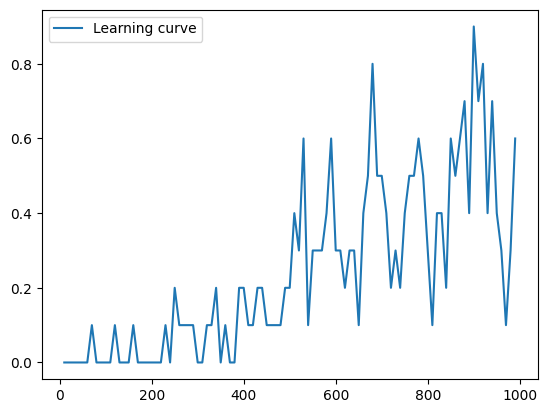

In [80]:
env = gym.make("FrozenLake-v1", is_slippery = True)

env.reset()

q_table, x_labs, running_success_rates = q_learning(env)

print(q_table)
plt.plot(x_labs, running_success_rates, label='Learning curve')
plt.legend()
plt.show()

In [81]:
# Test the learned policy
test_results = test_policy(env, q_table)
print("\nPolicy Test Results:")
for key, value in test_results.items():
    print(f"{key}: {value}")


Policy Test Results:
avg_reward: 0.619
var_reward: 0.23583899999999994
avg_horizon: 36.827
var_horizon: 762.703071
success_rate: 0.619


Note that in Q-Learning, we use epsilon-greedy method to explore. Test the method without exploration. That is check if taking the greedy action on the learned Q table works.

[[0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]
 [0. 0. 0. 0.]]


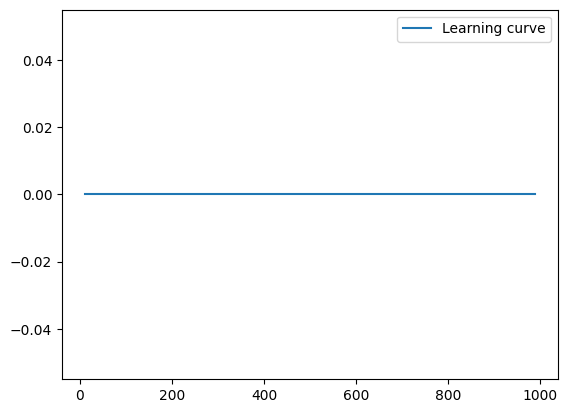

In [85]:
env = gym.make("FrozenLake-v1", is_slippery = True)

env.reset()

q_table, x_labs, running_success_rates = q_learning(env, use_greedy=False)

print(q_table)
plt.plot(x_labs, running_success_rates, label='Learning curve')
plt.legend()
plt.show()

The result shows that if we use greedy method, all the q values will stay 0. This is because we will only choose the first action (np.argmax will choose the first one when all the values are the same), then we will fall into the hole and get no reward, and the q-values won't be updated.

## 3. Deep Q-Network

In this problem, we revisit the Cartpole environment. Here, we use DQN (https://arxiv.org/abs/1312.5602) for the environment. DQN mainly has two components - NN for learning Q-function and a replay buffer
In this problem, you will need to fill in the commented out parts in the codes.
1. First implement a Neural Network of depth 3 to learn Q function.
2. Then, using the replay buffer, implement the Q-Learning agent (which is basically the "actor" who acts in the environment based on the learned Q function).
3. Fill in the training loop

In [102]:
env = gym.make("CartPole-v1")

NStates = env.observation_space.shape[0]
NActions = env.action_space.n

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

In [157]:
class QFunctionNet(nn.Module):
    def __init__(self, input_size, hidden_size, num_classes):
        super(QFunctionNet, self).__init__()
        self.fc1 = nn.Linear(input_size, 2 * hidden_size)
        self.fc2 = nn.Linear(2 * hidden_size, hidden_size)
        self.fc3 = nn.Linear(hidden_size, num_classes)
        self.relu = nn.ReLU()

    def forward(self, x):
        x = self.relu(self.fc1(x))
        x = self.relu(self.fc2(x))
        out = self.fc3(x)
        return out

This buffer should hold past data collected by the agent. It should have a max memory size of 10,000. The buffer should be circular, in the sense that the oldest data gets removed once it reaches the overflow limit.

You need to implement add_to_buffer, which allows you to add data to the buffer. You also need to implement sample_buffer, which pulls at random (with replacement) 32 datapoints from the buffer and returns them.

In [151]:
class ReplayBuffer:
    def __init__(self, mem_size=10000):
        self.mem_count = 0
        self.mem_size = mem_size
        self.states = np.zeros((mem_size, NStates), dtype=np.float32)
        self.actions = np.zeros(mem_size, dtype=np.int64)
        self.rewards = np.zeros(mem_size, dtype=np.float32)
        self.next_states = np.zeros((mem_size, NStates), dtype=np.float32)
        self.terminated = np.zeros(mem_size, dtype=bool)

    def add_to_buffer(self, state, action, reward, next_state, terminated):
        mem_index = self.mem_count % self.mem_size

        self.states[mem_index] = state
        self.actions[mem_index] = int(action)
        self.rewards[mem_index] = reward
        self.next_states[mem_index] = next_state
        self.terminated[mem_index] = terminated

        self.mem_count += 1
        return True

    def sample_buffer(self, batch_size=256):
        # return 32 random points from the buffer.
        # sampling with replacement is okay.
        MEM_MAX = min(self.mem_count, self.mem_size)
        batch_indices = np.random.choice(MEM_MAX, size=batch_size, replace=True)
        
        states = self.states[batch_indices]
        actions = self.actions[batch_indices]
        rewards = self.rewards[batch_indices]
        states_ = self.next_states[batch_indices]
        dones = self.terminated[batch_indices]

        return states, actions, rewards, states_, dones

RL agents are typically written as classes with three essential methods. First, an initialization. Second, train which takes a batch of states, actions, rewards, next states, and termination signals and trains the neural network loss. Finally, a get_action function which takes the current observation and returns the action the agent should take.

In [187]:
class QLearningAgent:
    def __init__(self, env, epsilon_greedy_threshold=0.50, epsilon_decay=0.995, gamma = 0.99):
        self.env = env
        self.q_func = QFunctionNet(input_size = NStates, hidden_size = 128, num_classes = NActions)
        self.q_target = QFunctionNet(input_size = NStates, hidden_size=128, num_classes = NActions)
        self.q_target.eval()
        self.criterion = nn.MSELoss()
        self.optimizer = torch.optim.Adam(self.q_func.parameters(), lr=0.001)
        self.epsilon_greedy_threshold = epsilon_greedy_threshold
        self.epsilon_decay = epsilon_decay
        self.gamma = gamma
        self.total_training_steps = 0

    def train(self, states, acts, rews, next_states, terminated):
        states_torch = torch.from_numpy(states).float()
        acts_torch = torch.from_numpy(acts).long()
        next_states_torch = torch.from_numpy(next_states).float()
        rews_torch = torch.from_numpy(rews).float()
        terminated_torch = torch.from_numpy(terminated).bool()

        batch_indices = torch.arange(states_torch.size(0))

        # Get Q-values from the main network
        q_values = self.q_func(states_torch)
        
        # Get Q-values from both networks for the next states
        next_q_values_main = self.q_func(next_states_torch)
        next_q_values_target = self.q_target(next_states_torch)

        predicted_value_of_actions_actually_taken = q_values[batch_indices, acts_torch]
        
        # Double Q-learning: use target network to select action, main network to evaluate it
        best_actions = next_q_values_target.argmax(1)
        max_q_value_of_next_state = next_q_values_main[batch_indices, best_actions]

        q_target = rews_torch + self.gamma * max_q_value_of_next_state * (~terminated_torch)

        loss = self.criterion(q_target, predicted_value_of_actions_actually_taken)

        self.optimizer.zero_grad()
        loss.backward()
        self.optimizer.step()

        if self.total_training_steps % 1 == 0:  # every step decrease the exploration
            self.epsilon_greedy_threshold = max(self.epsilon_greedy_threshold * self.epsilon_decay, 0.01)

        self.total_training_steps += 1

    def get_action(self, obs, evaluate=False):
        obs_correct_format = torch.from_numpy(np.expand_dims(obs, 0))
        action_values = self.q_func(obs_correct_format).detach().numpy()[0]
        if evaluate is False:
            p = random.uniform(0, 1)
            if p < self.epsilon_greedy_threshold:
                return self.env.action_space.sample()  # Explore: choose a random action
            else:
                return np.argmax(action_values)  # Exploit: choose the best known action
        else:
            return np.argmax(action_values)  # During evaluation, always choose the best action
        
    def polyak_update(self, tau=0.01):
        """
        Perform a soft update of the target network parameters.
        
        Args:
            tau (float): The interpolation parameter. Default is 0.005.
        """
        for target_param, local_param in zip(self.q_target.parameters(), self.q_func.parameters()):
            target_param.data.copy_(tau * local_param.data + (1.0 - tau) * target_param.data)

In [163]:
def plot_fancy(steps_survived_history):
    plt.figure(figsize=(10, 6))
    plt.clf()
    steps_survived_history_torch = torch.FloatTensor(steps_survived_history)
    plt.title('Training Progress')
    plt.xlabel('Episode')
    plt.ylabel('Duration')
    plt.plot(np.array(steps_survived_history), label='Steps Survived')
    if len(steps_survived_history) >= 20:
        means = steps_survived_history_torch.unfold(0, 20, 1).mean(1).view(-1)
        means = torch.cat((torch.zeros(19), means))
        plt.plot(means.numpy(), label='Moving Average (20 episodes)')
    plt.legend()
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.tight_layout()
    plt.ion()  # Turn on interactive mode
    plt.show()
    plt.pause(0.001)

In [182]:
def deep_q_learning(env_name='CartPole-v1', epochs=2000, epsilon_decay = 0.99, epsilon_decay_threshold = 0.1, tau = 0.005, gamma = 0.99):
    env = gym.make(env_name)
    env.action_space.seed(42)
    env.observation_space.seed(42)

    obs, info = env.reset()

    replay_buffer = ReplayBuffer()
    q_learning_agent = QLearningAgent(env,epsilon_greedy_threshold=epsilon_decay_threshold , epsilon_decay=epsilon_decay, gamma = gamma)

    steps_survived_history = []
    x_labs = []

    for ep in range(epochs):
        obs, info = env.reset()
        terminated = False

        steps_survived = 0

        while not terminated:
            action = q_learning_agent.get_action(obs)
            next_obs, reward, terminated, _, _ = env.step(action)

            replay_buffer.add_to_buffer(obs, action, reward, next_obs, terminated)

            obs = next_obs
            steps_survived += 1

            if steps_survived > 450:
                break

        if(len(replay_buffer.states)) > 100:
            for i in range(0, 20):
                states_mb, acts_mb, rews_mb, next_states_mb, terminated = replay_buffer.sample_buffer()
                q_learning_agent.train(states_mb, acts_mb, rews_mb, next_states_mb, terminated)
                q_learning_agent.polyak_update(tau = tau)

        if ep % 7 == 0 and ep > 0:
            steps_survived = 0
            obs, _ = env.reset()
            terminated = False
            while not terminated:
                steps_survived += 1
                action = q_learning_agent.get_action(obs=obs, evaluate=True)
                next_obs, reward, terminated, _, _ = env.step(action)
                obs = next_obs
                if steps_survived > 450:
                    break

            steps_survived_history.append(steps_survived)
            # print(steps_survived)
            
            # plot_fancy(steps_survived_history)
            x_labs.append(ep)

    # plt.plot(x_labs, steps_survived_history, label='Steps Survived')
    # plt.legend()
    # plt.show()
    plot_fancy(steps_survived_history)
    return steps_survived_history

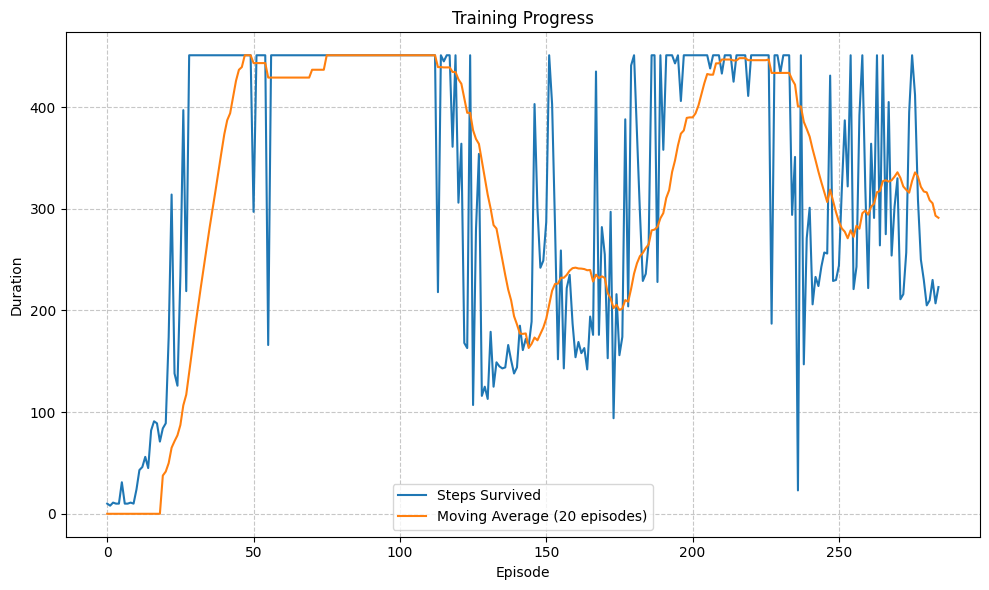

In [175]:
deep_q_learning()

How does it perform? Can you do better? Some ideas you can try out are 1) adjust hyperparameters 2) change the rate of epsilon decay 3) change the architecture of NN for learning Q-function, and so on.

The variance is huge according to the steps survived curve. That's probability because of the overestimation problem. Here we change to *double Q learning*, which use target net to choose action and use original network to evaluate for the target. This will reduce the overestimation problem.

Besides, we also try to adjust the hyperparameters, including the decay rate $\gamma$, the batch size, and the hidden size of the neural network. The best result is shown in the above plot, which is much stable than what we original did.

In [183]:
import itertools
import numpy as np
import matplotlib.pyplot as plt

In [184]:
def plot_results(results):
    fig, axs = plt.subplots(2, 2, figsize=(15, 15))
    params = ['Epsilon Decay', 'Epsilon Decay Threshold', 'Tau', 'Gamma']
    
    for i, param in enumerate(params):
        performances = [r[1] for r in results]
        param_values = [r[0][i] for r in results]
        
        ax = axs[i // 2, i % 2]
        ax.scatter(param_values, performances)
        ax.set_xlabel(param)
        ax.set_ylabel('Performance')
        ax.set_title(f'{param} vs Performance')

    plt.tight_layout()
    plt.show()

In [189]:
def hyperparameter_tuning():
    # Define the hyperparameter ranges
    epsilon_decay_range = [0.99, 0.995, 0.998]
    epsilon_decay_threshold_range = [0.05, 0.1, 0.2]
    tau_range = [0.001, 0.005, 0.01]
    gamma_range = [0.95, 0.99, 0.999]

    # Create all combinations of hyperparameters
    hyperparameter_combinations = list(itertools.product(
        epsilon_decay_range,
        epsilon_decay_threshold_range,
        tau_range,
        gamma_range
    ))

    best_performance = -np.inf
    best_hyperparameters = None
    all_results = []

    for combo in hyperparameter_combinations:
        epsilon_decay, epsilon_decay_threshold, tau, gamma = combo
        
        # Run the deep Q-learning algorithm with the current hyperparameters
        steps_survived_history = deep_q_learning(
            epochs=1000,  # Reduced for faster tuning
            epsilon_decay=epsilon_decay,
            epsilon_decay_threshold=epsilon_decay_threshold,
            tau=tau,
            gamma=gamma
        )
        
        # Calculate the performance metric (e.g., average of last 100 episodes)
        performance = np.mean(steps_survived_history[-100:])
        all_results.append((combo, performance))
        
        if performance > best_performance:
            best_performance = performance
            best_hyperparameters = combo

        print(f"Hyperparameters: {combo}")
        print(f"Performance: {performance}")
        print("--------------------")

    print(f"Best Hyperparameters: {best_hyperparameters}")
    print(f"Best Performance: {best_performance}")

    # Plot results
    plot_results(all_results)

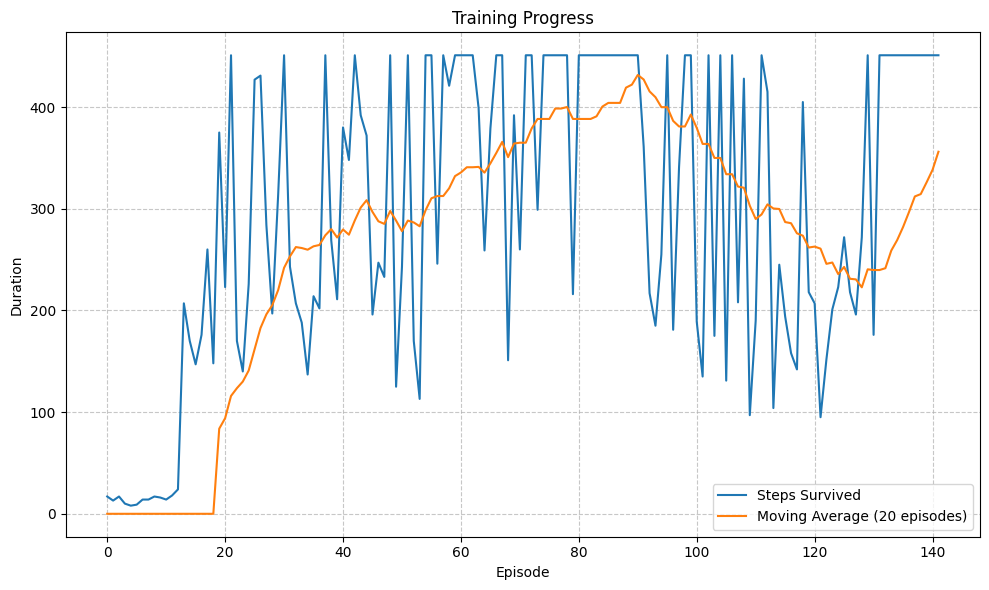

Hyperparameters: (0.99, 0.05, 0.001, 0.95)
Performance: 341.98
--------------------


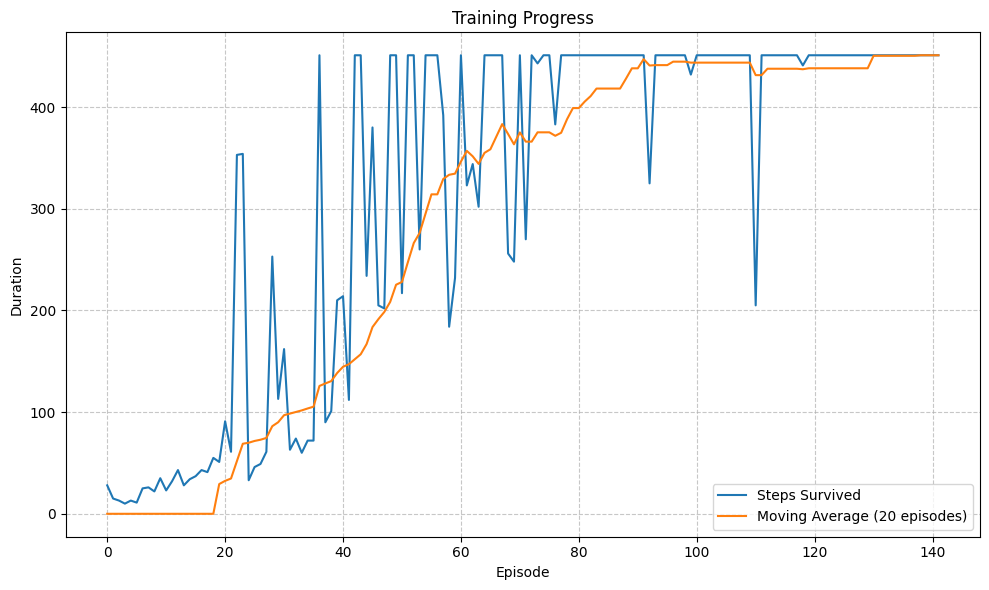

Hyperparameters: (0.99, 0.05, 0.001, 0.99)
Performance: 419.07
--------------------


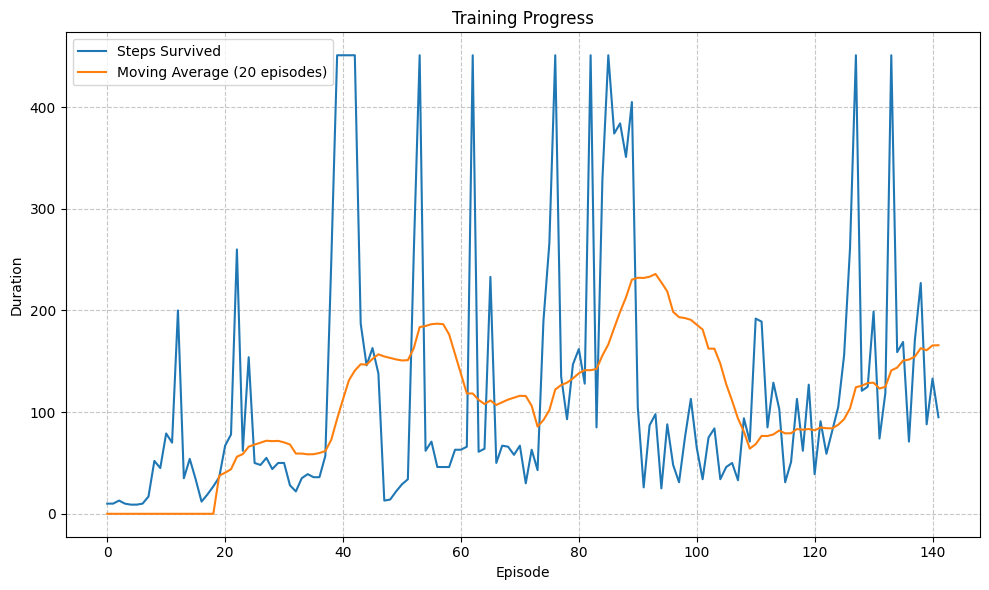

Hyperparameters: (0.99, 0.05, 0.001, 0.999)
Performance: 138.32
--------------------


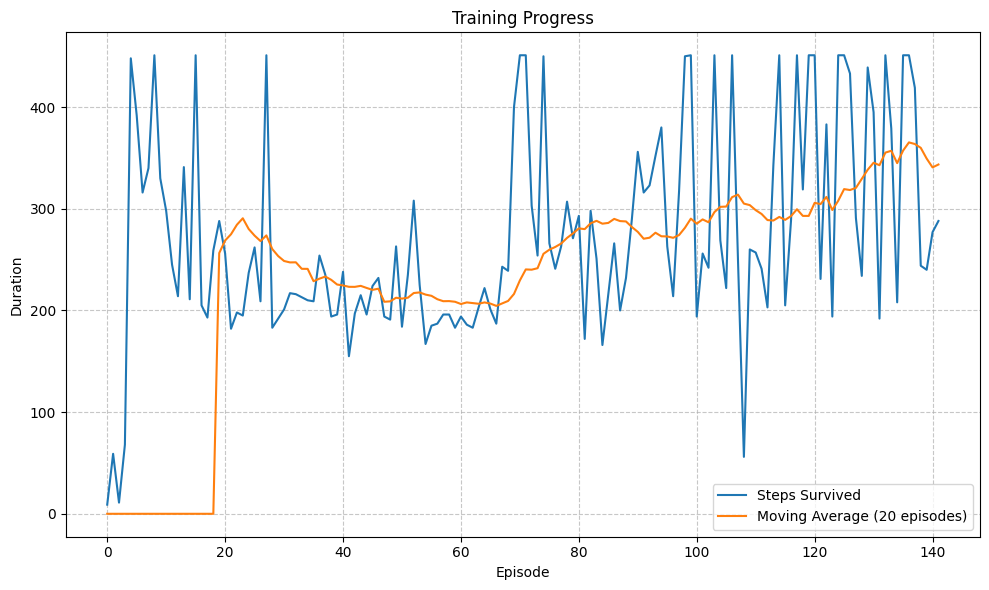

Hyperparameters: (0.99, 0.05, 0.005, 0.95)
Performance: 285.12
--------------------


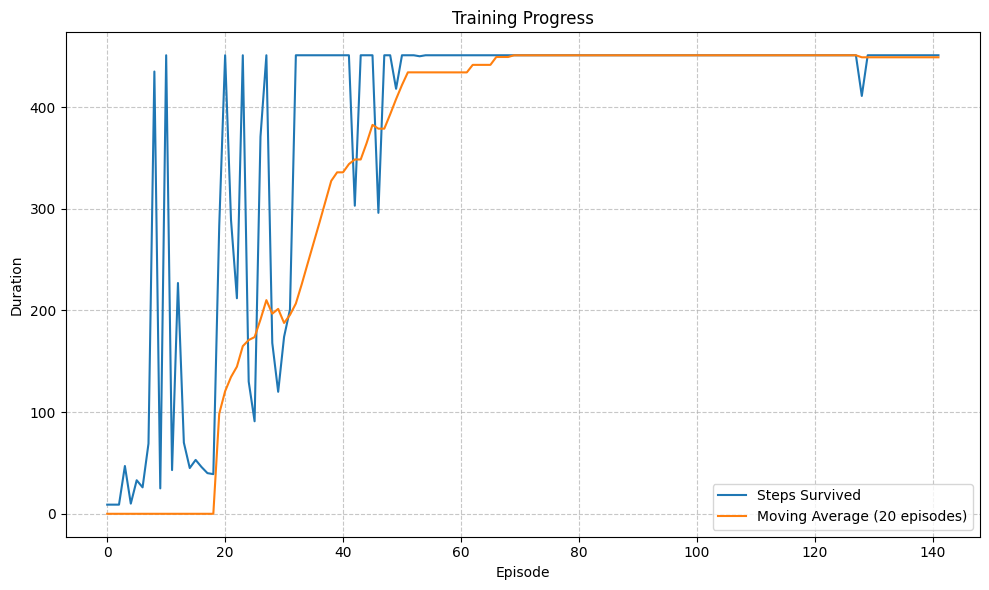

Hyperparameters: (0.99, 0.05, 0.005, 0.99)
Performance: 447.23
--------------------


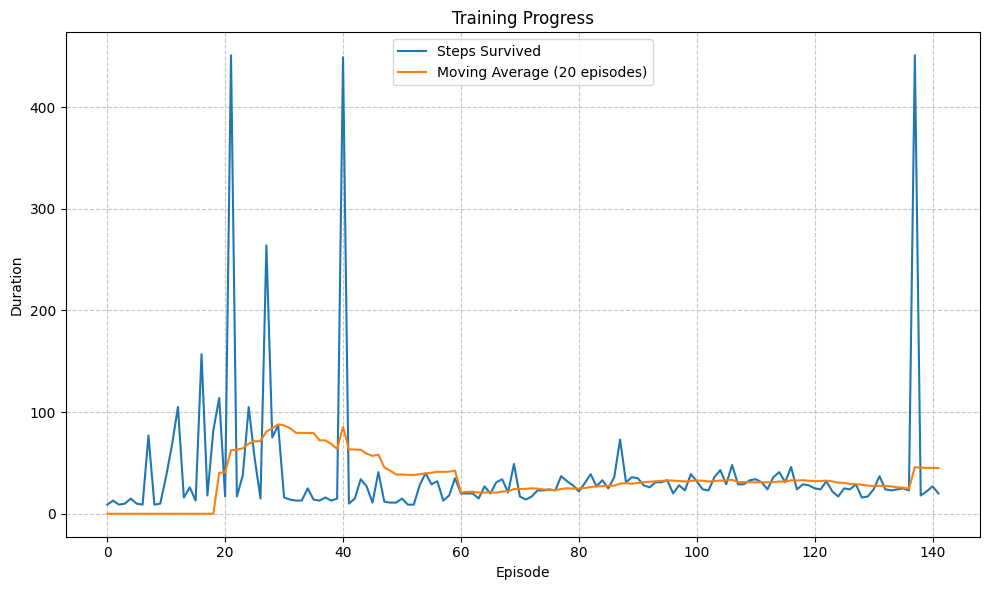

Hyperparameters: (0.99, 0.05, 0.005, 0.999)
Performance: 31.3
--------------------


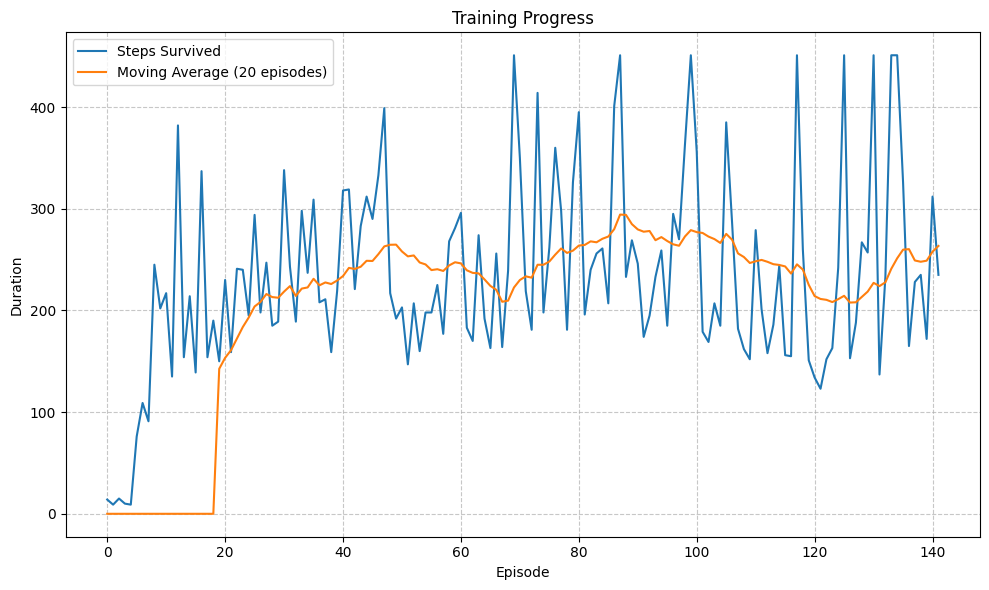

Hyperparameters: (0.99, 0.05, 0.01, 0.95)
Performance: 250.98
--------------------


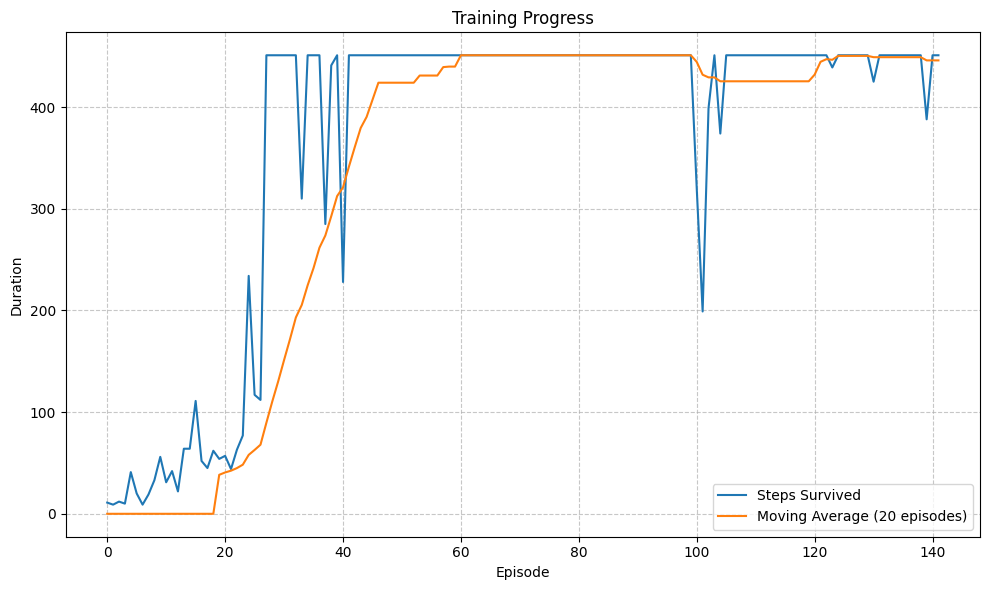

Hyperparameters: (0.99, 0.05, 0.01, 0.99)
Performance: 444.87
--------------------


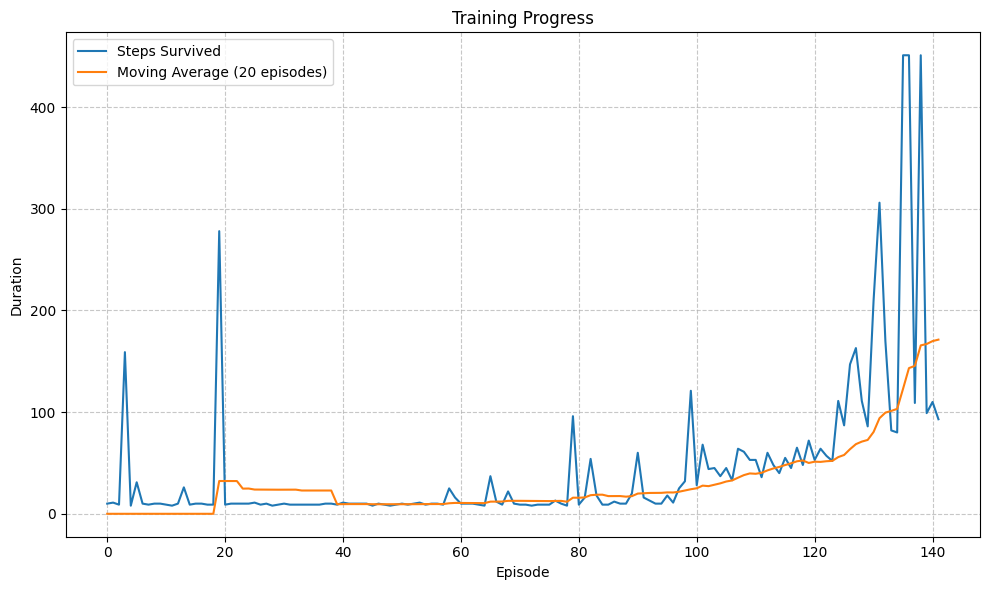

Hyperparameters: (0.99, 0.05, 0.01, 0.999)
Performance: 55.36
--------------------


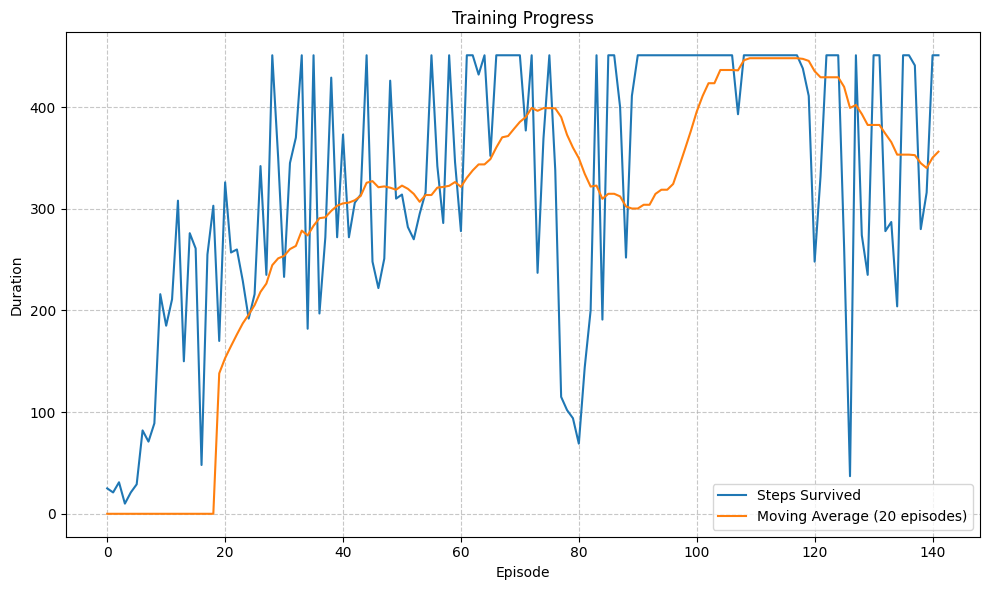

Hyperparameters: (0.99, 0.1, 0.001, 0.95)
Performance: 372.28
--------------------


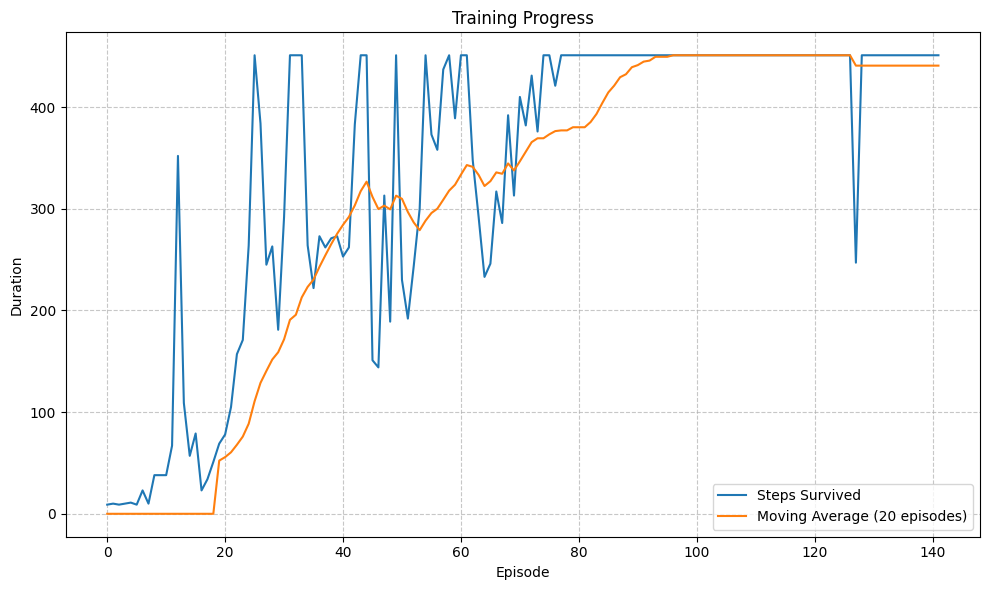

Hyperparameters: (0.99, 0.1, 0.001, 0.99)
Performance: 413.2
--------------------


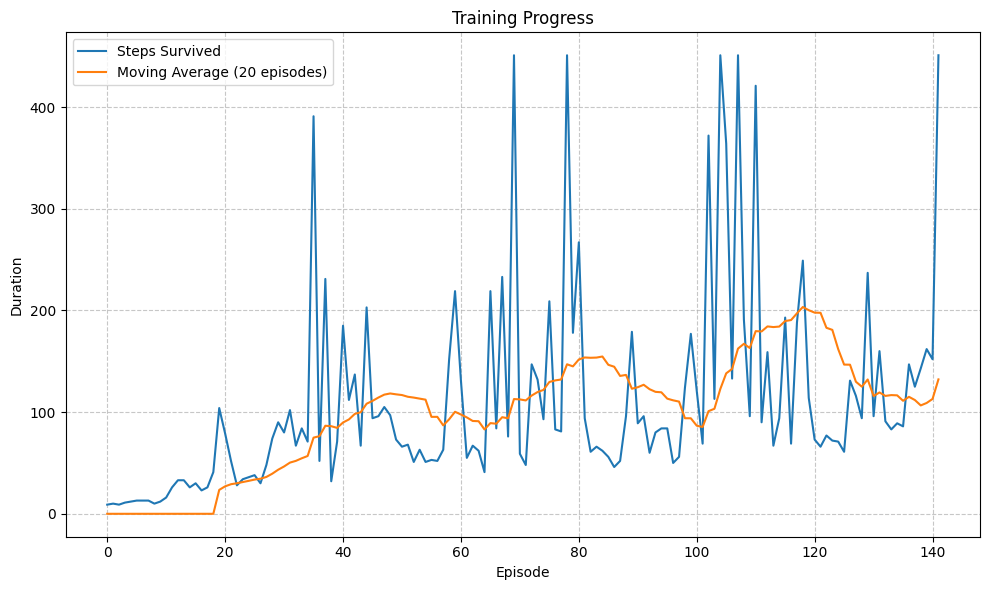

Hyperparameters: (0.99, 0.1, 0.001, 0.999)
Performance: 132.77
--------------------


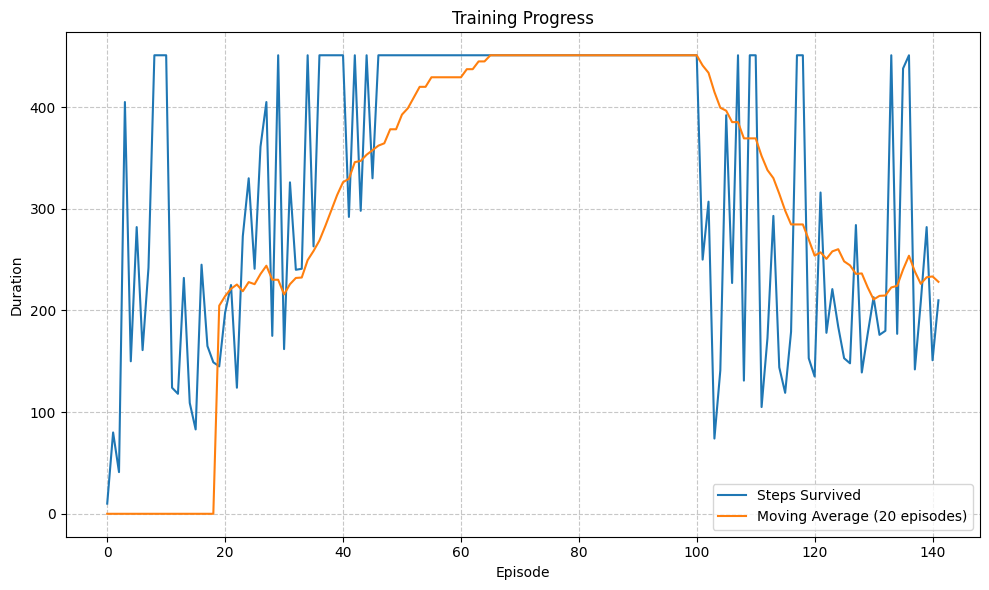

Hyperparameters: (0.99, 0.1, 0.005, 0.95)
Performance: 362.92
--------------------


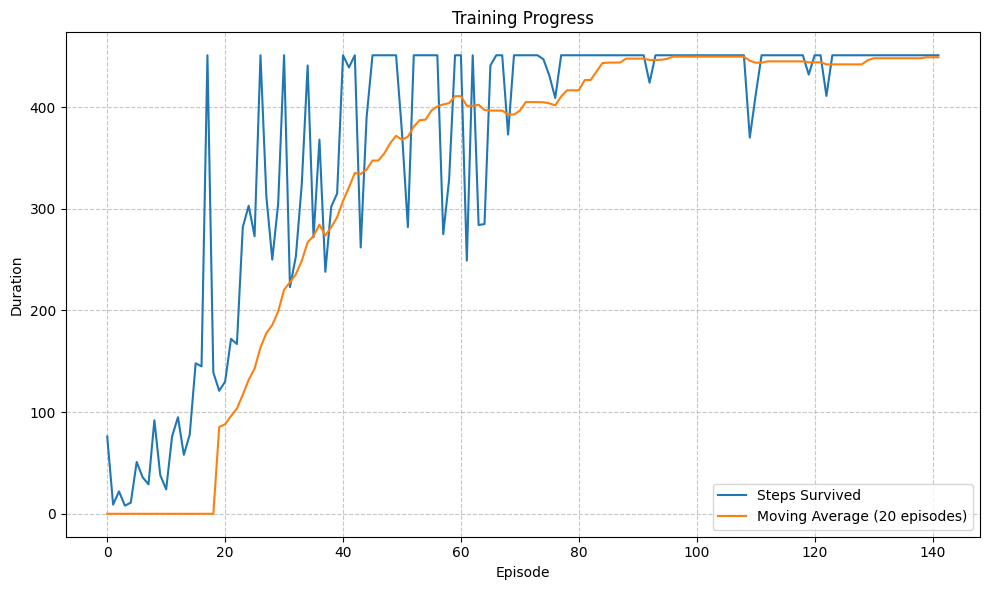

Hyperparameters: (0.99, 0.1, 0.005, 0.99)
Performance: 434.12
--------------------


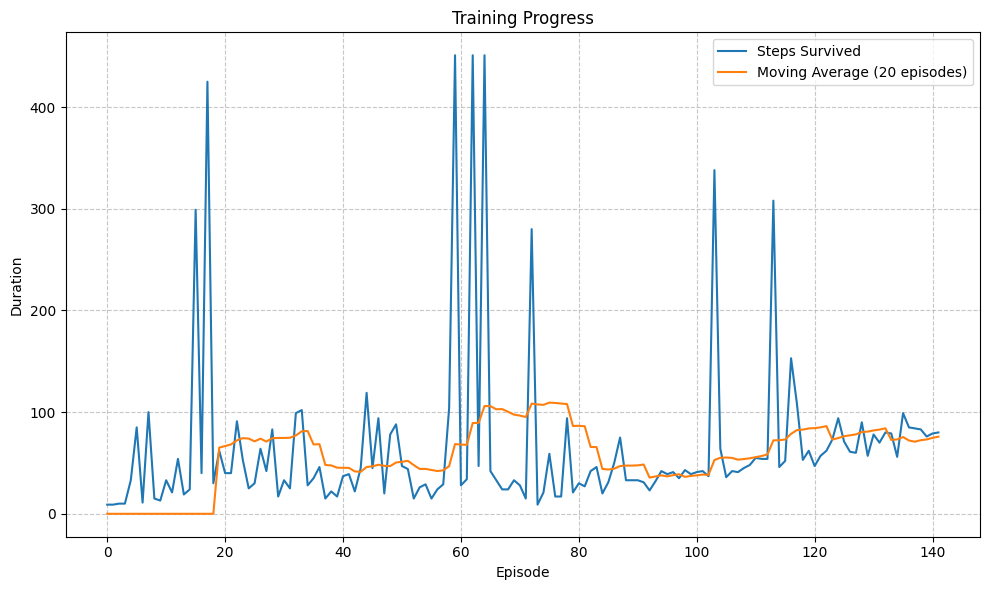

Hyperparameters: (0.99, 0.1, 0.005, 0.999)
Performance: 70.68
--------------------


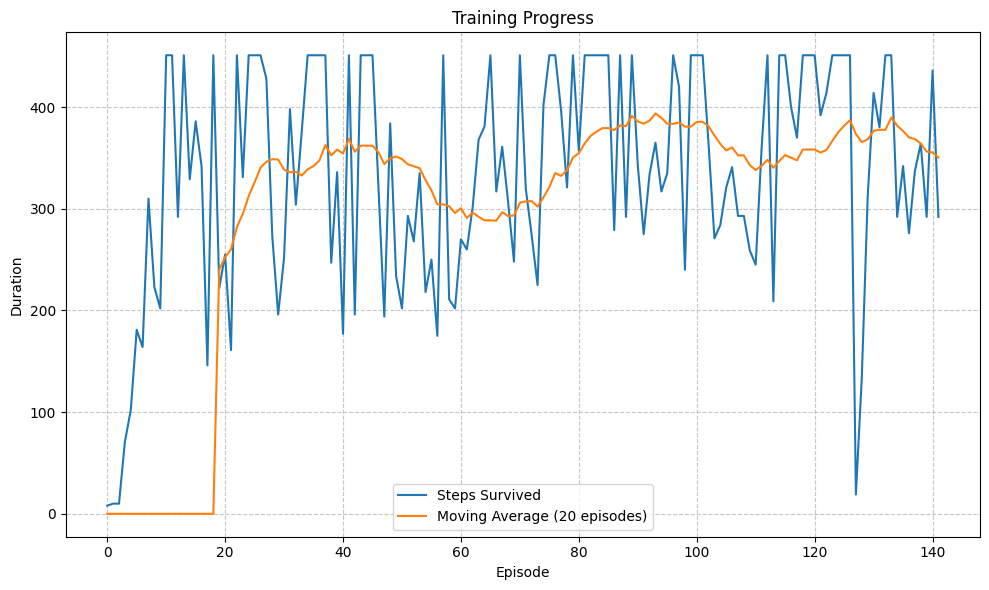

Hyperparameters: (0.99, 0.1, 0.01, 0.95)
Performance: 349.31
--------------------


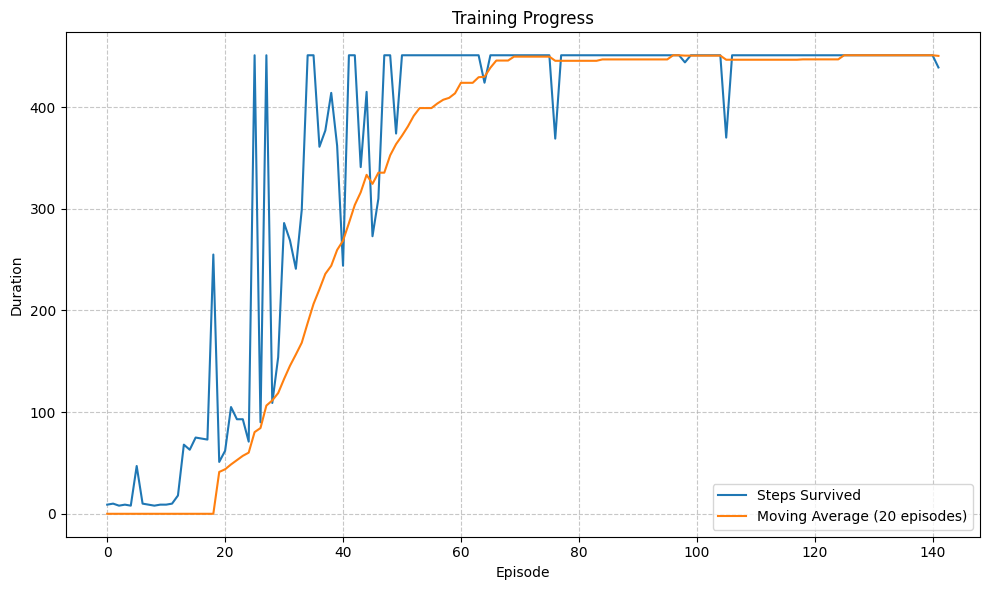

Hyperparameters: (0.99, 0.1, 0.01, 0.99)
Performance: 443.49
--------------------


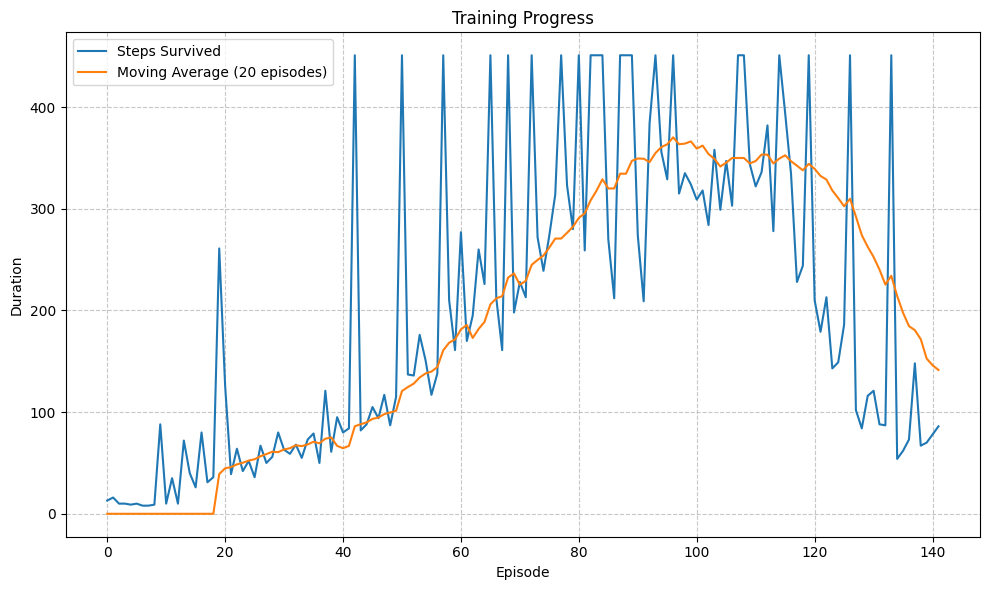

Hyperparameters: (0.99, 0.1, 0.01, 0.999)
Performance: 263.41
--------------------


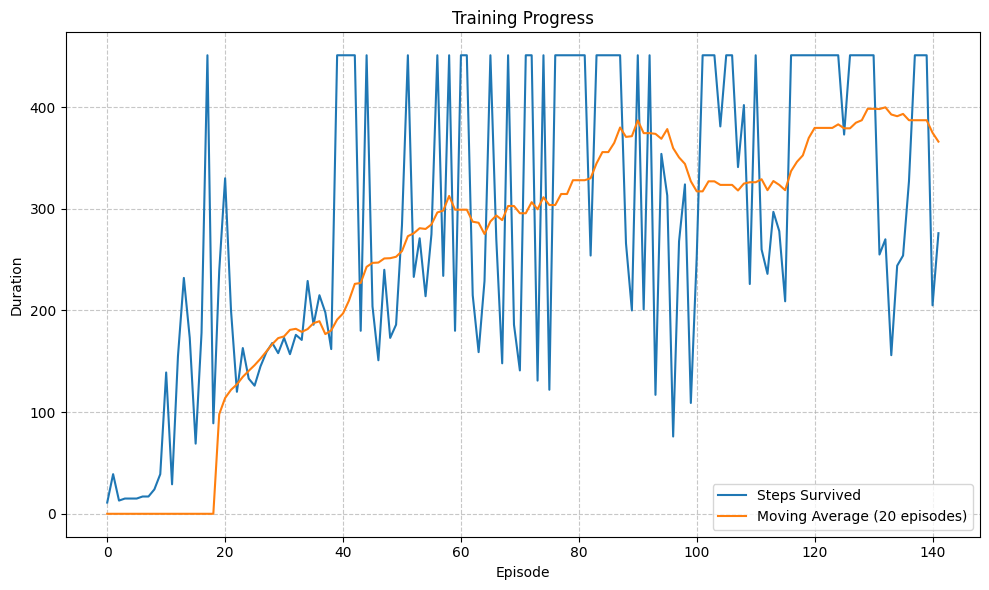

Hyperparameters: (0.99, 0.2, 0.001, 0.95)
Performance: 337.99
--------------------


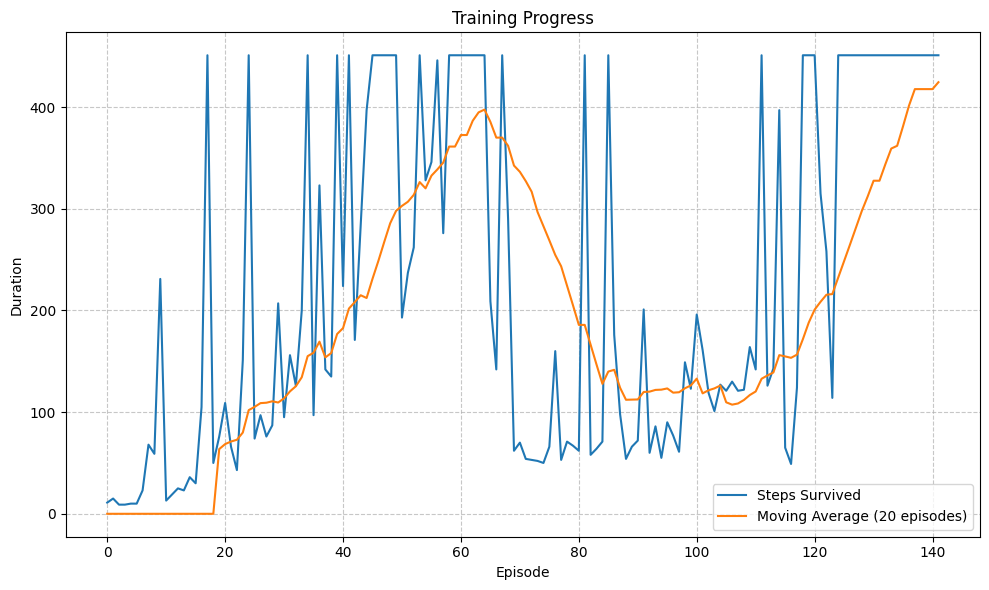

Hyperparameters: (0.99, 0.2, 0.001, 0.99)
Performance: 261.96
--------------------


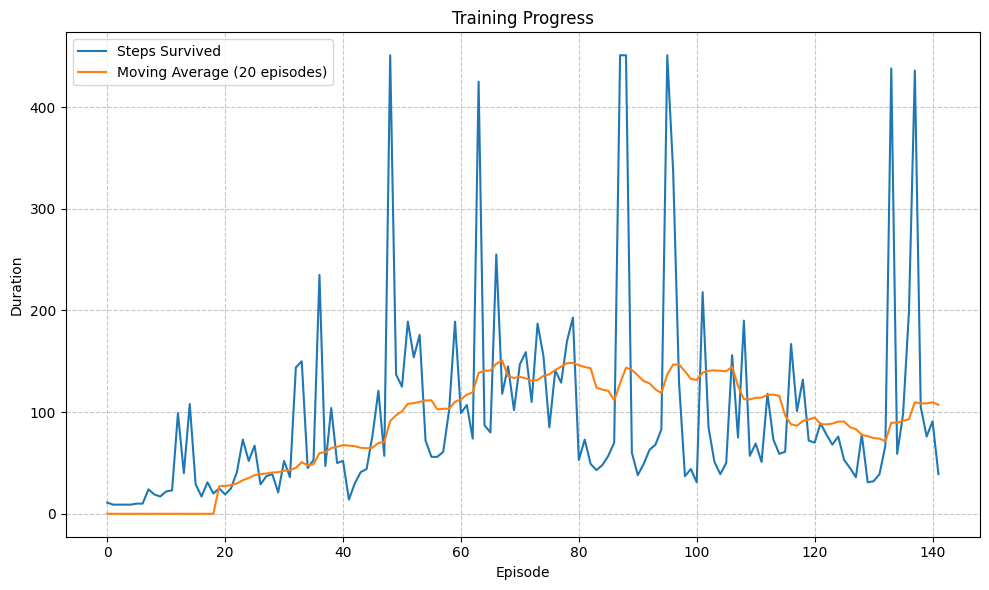

Hyperparameters: (0.99, 0.2, 0.001, 0.999)
Performance: 119.18
--------------------


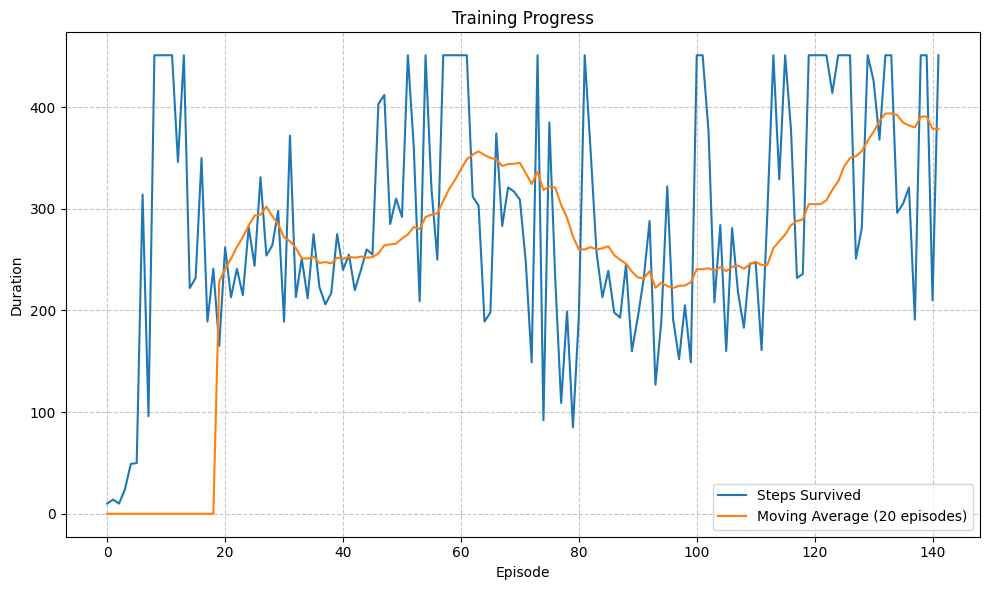

Hyperparameters: (0.99, 0.2, 0.005, 0.95)
Performance: 306.5
--------------------


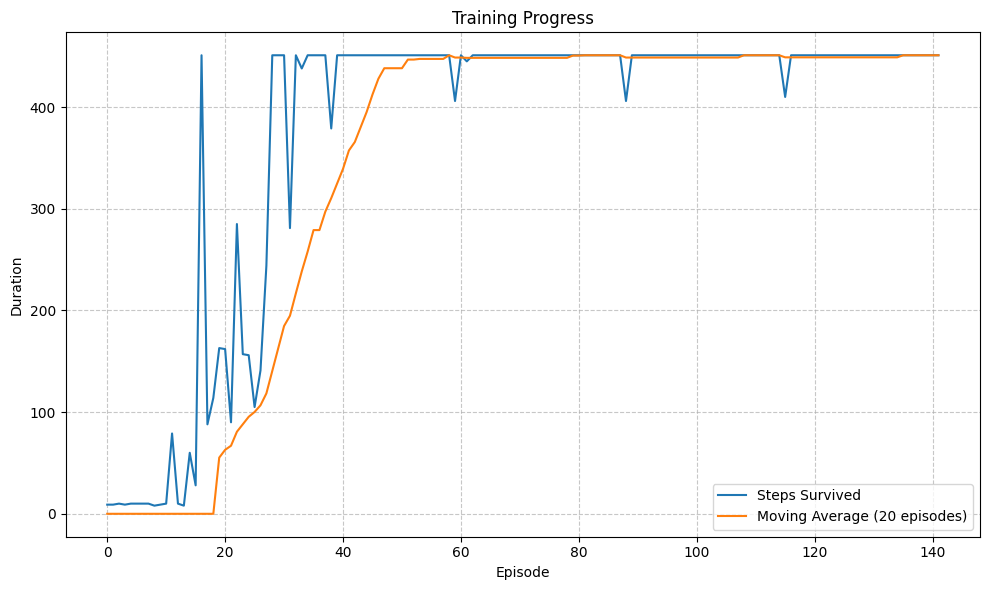

Hyperparameters: (0.99, 0.2, 0.005, 0.99)
Performance: 449.63
--------------------


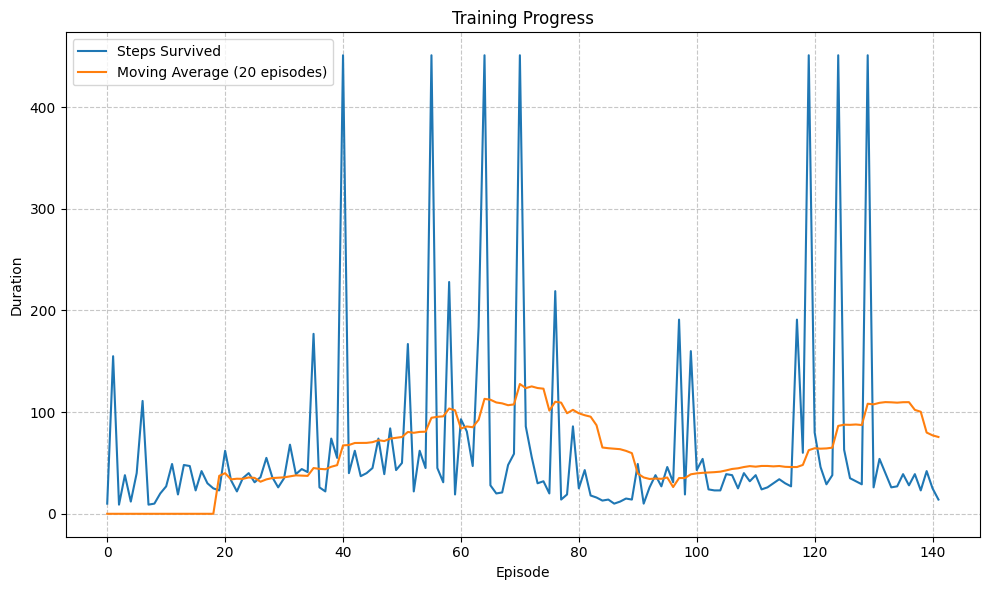

Hyperparameters: (0.99, 0.2, 0.005, 0.999)
Performance: 72.55
--------------------


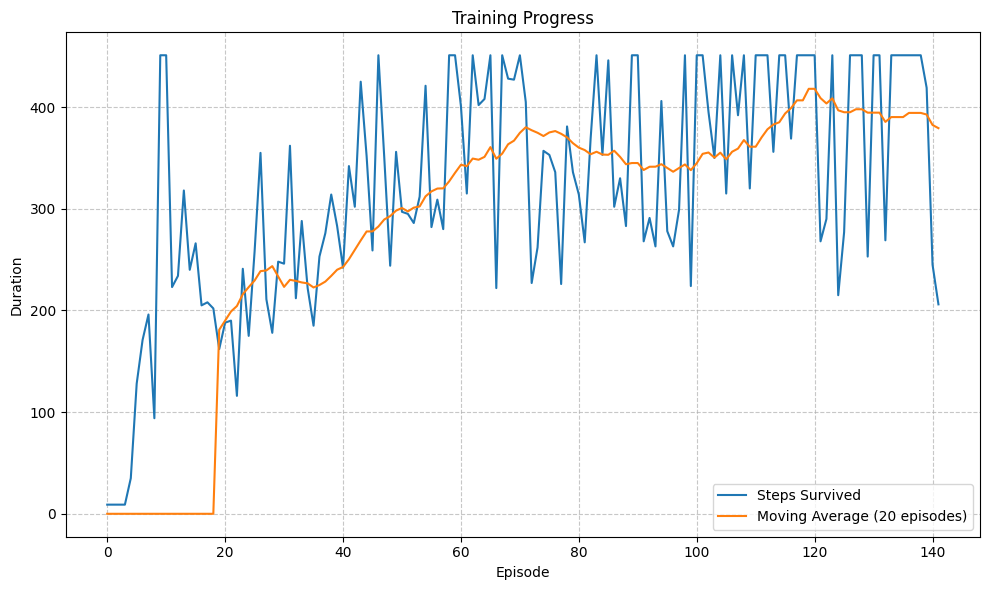

Hyperparameters: (0.99, 0.2, 0.01, 0.95)
Performance: 368.38
--------------------


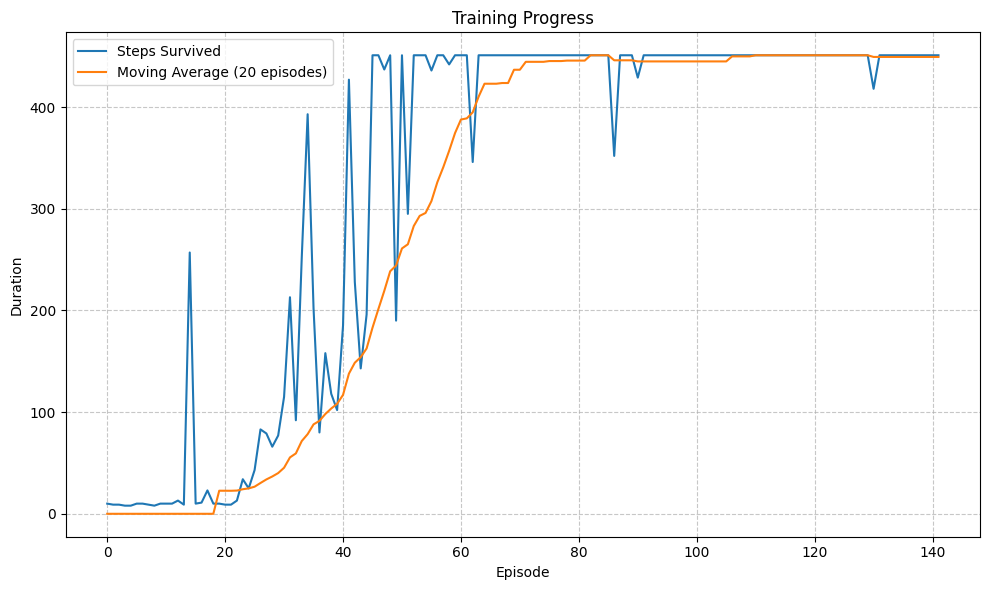

Hyperparameters: (0.99, 0.2, 0.01, 0.99)
Performance: 436.0
--------------------


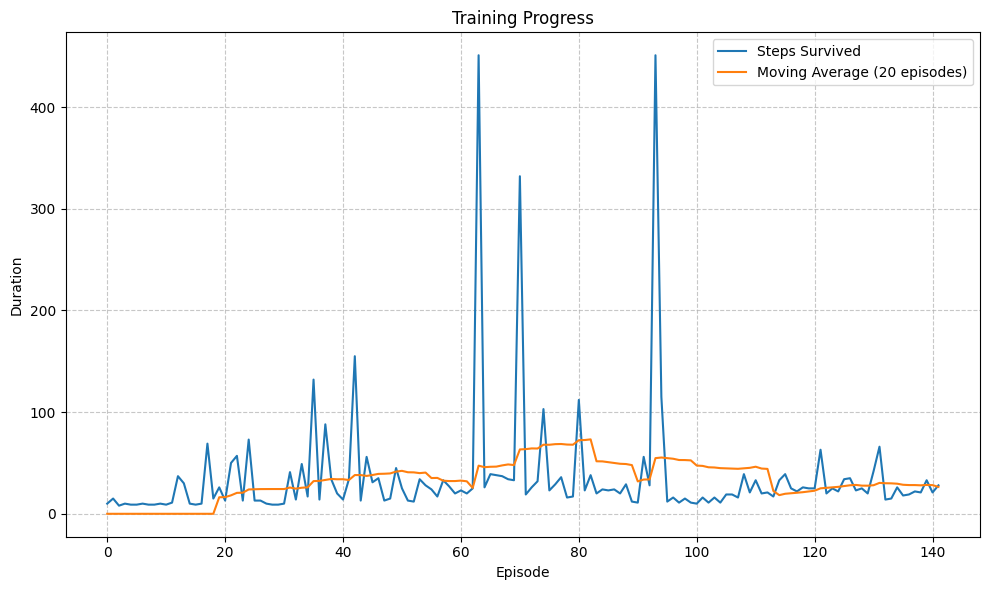

Hyperparameters: (0.99, 0.2, 0.01, 0.999)
Performance: 40.62
--------------------


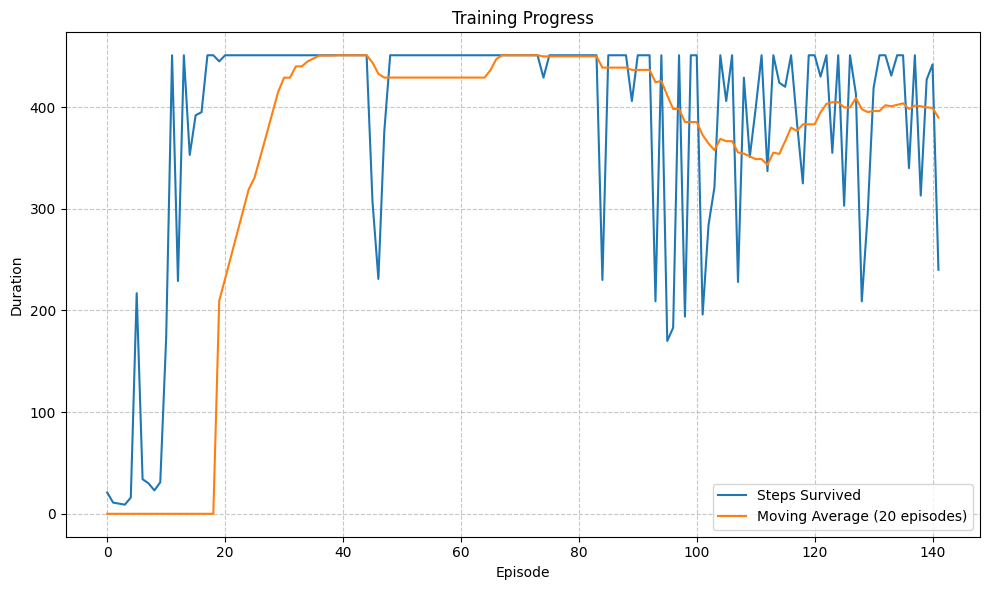

Hyperparameters: (0.995, 0.05, 0.001, 0.95)
Performance: 407.21
--------------------


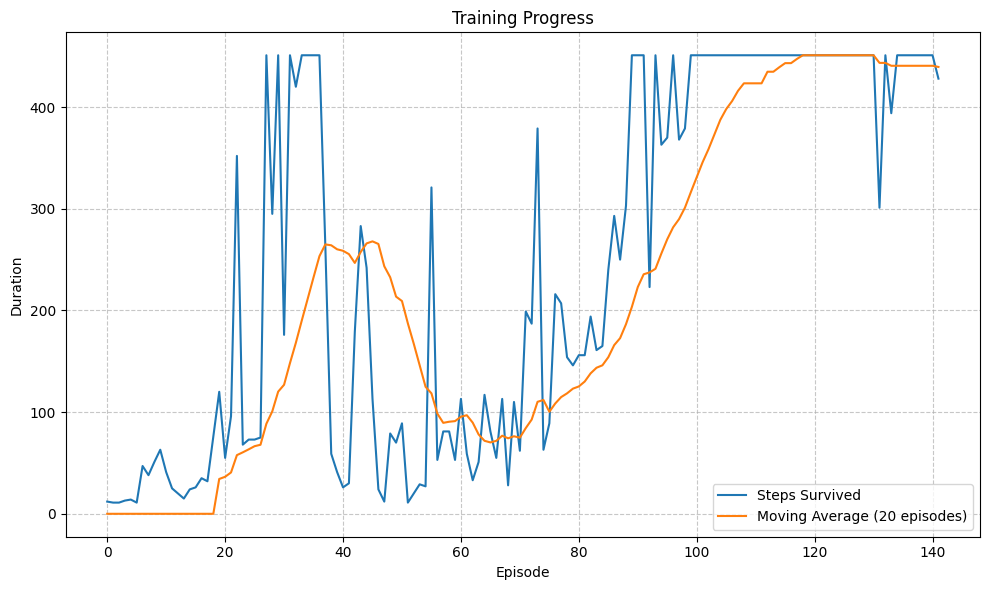

Hyperparameters: (0.995, 0.05, 0.001, 0.99)
Performance: 292.68
--------------------


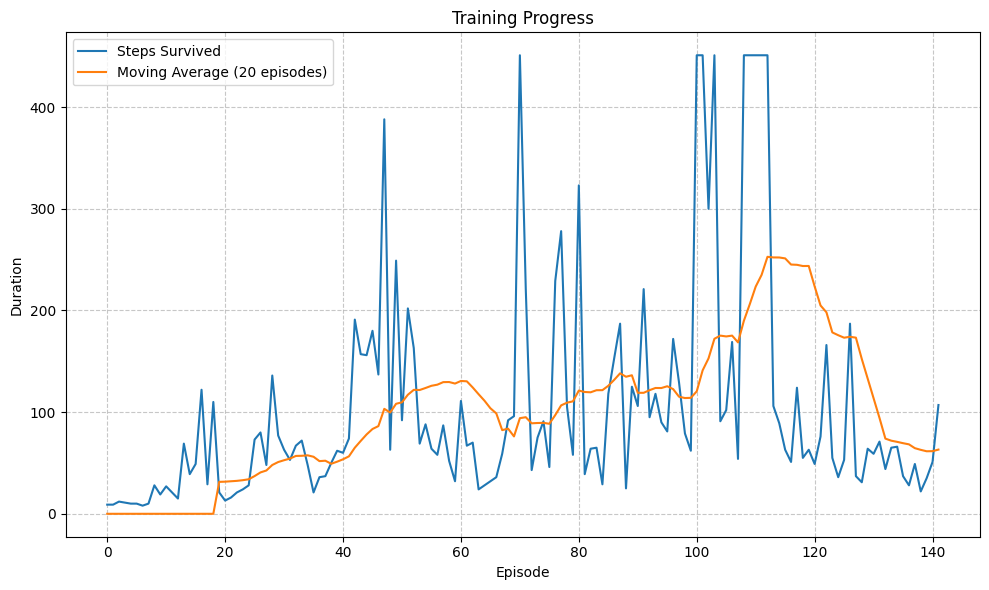

Hyperparameters: (0.995, 0.05, 0.001, 0.999)
Performance: 131.84
--------------------


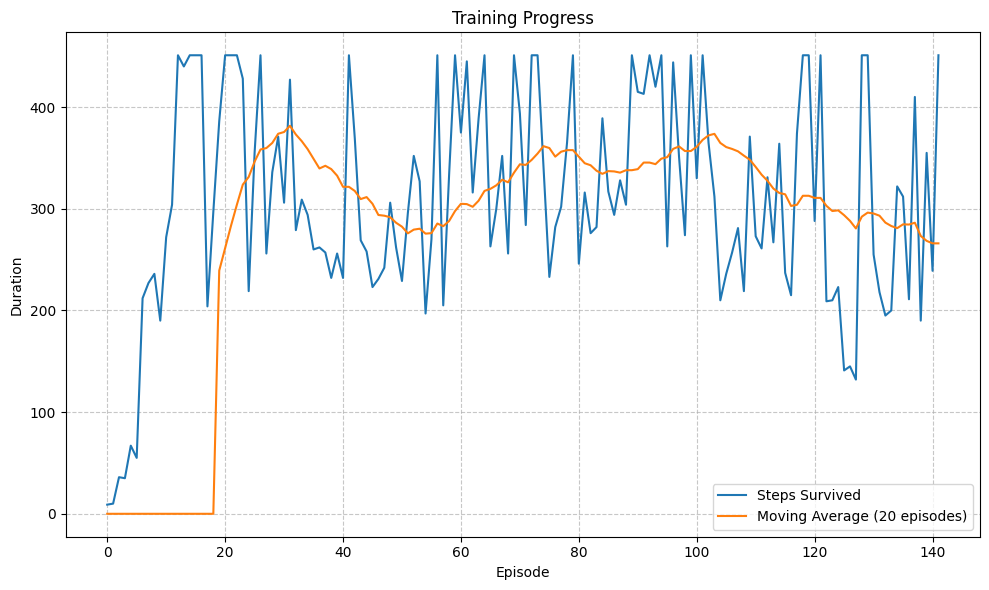

Hyperparameters: (0.995, 0.05, 0.005, 0.95)
Performance: 318.77
--------------------


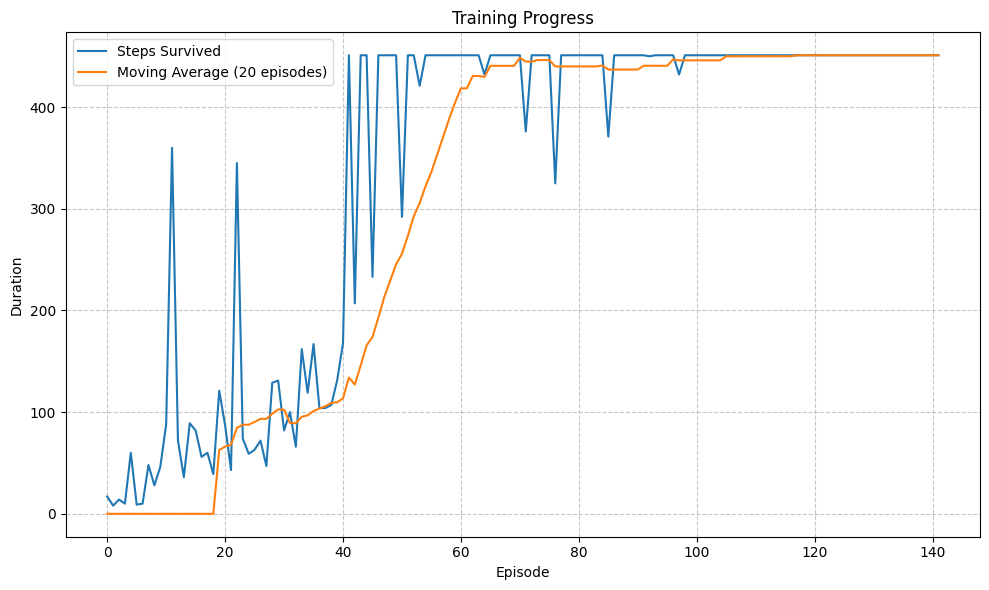

Hyperparameters: (0.995, 0.05, 0.005, 0.99)
Performance: 441.29
--------------------


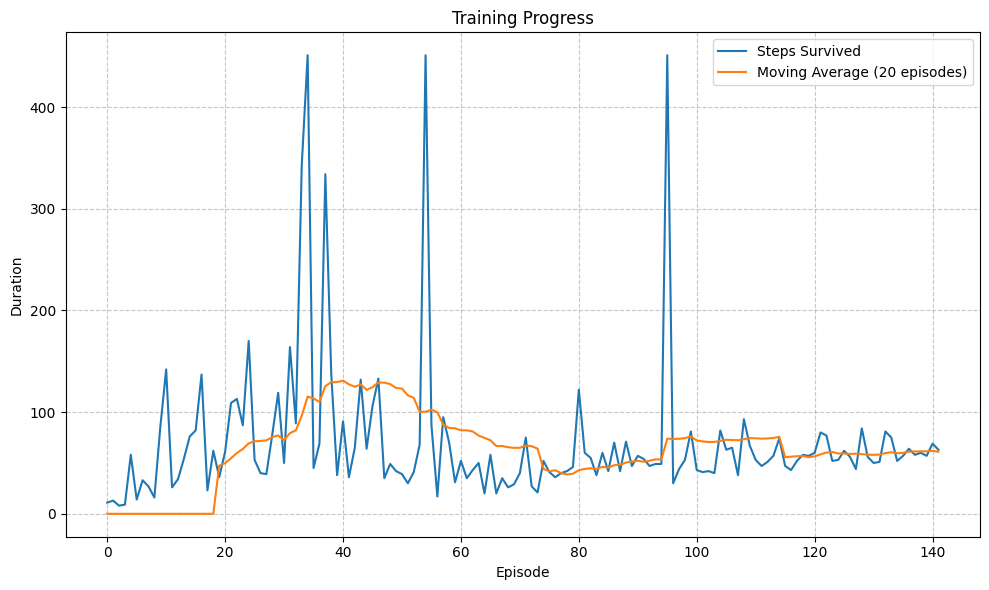

Hyperparameters: (0.995, 0.05, 0.005, 0.999)
Performance: 63.39
--------------------


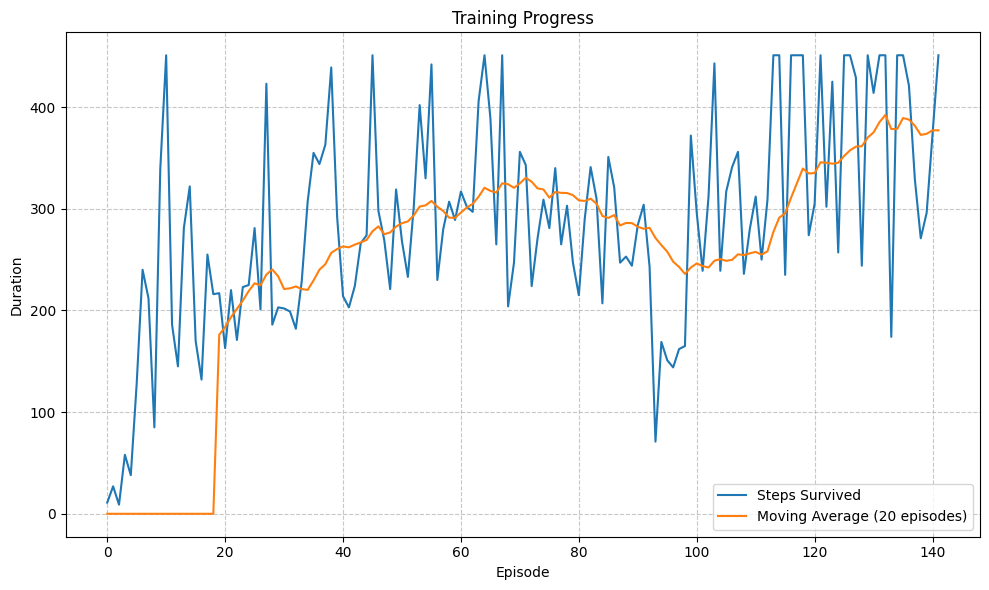

Hyperparameters: (0.995, 0.05, 0.01, 0.95)
Performance: 315.1
--------------------


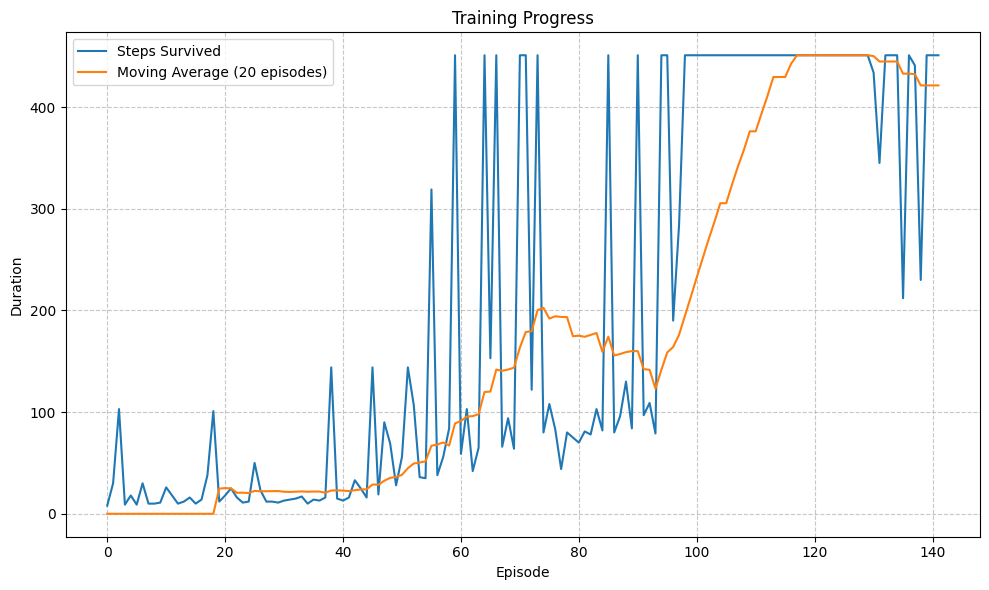

Hyperparameters: (0.995, 0.05, 0.01, 0.99)
Performance: 278.61
--------------------


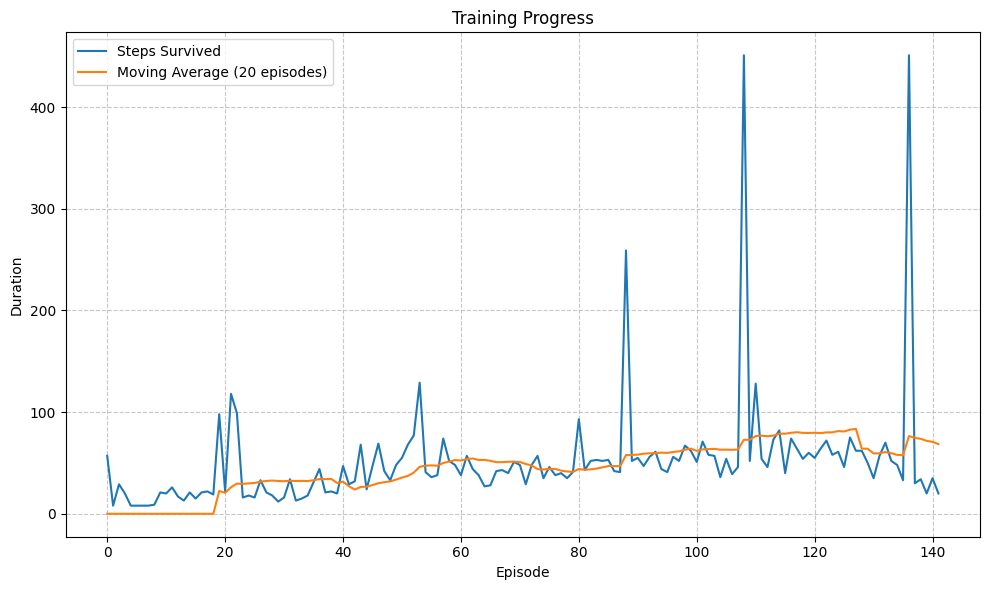

Hyperparameters: (0.995, 0.05, 0.01, 0.999)
Performance: 61.67
--------------------


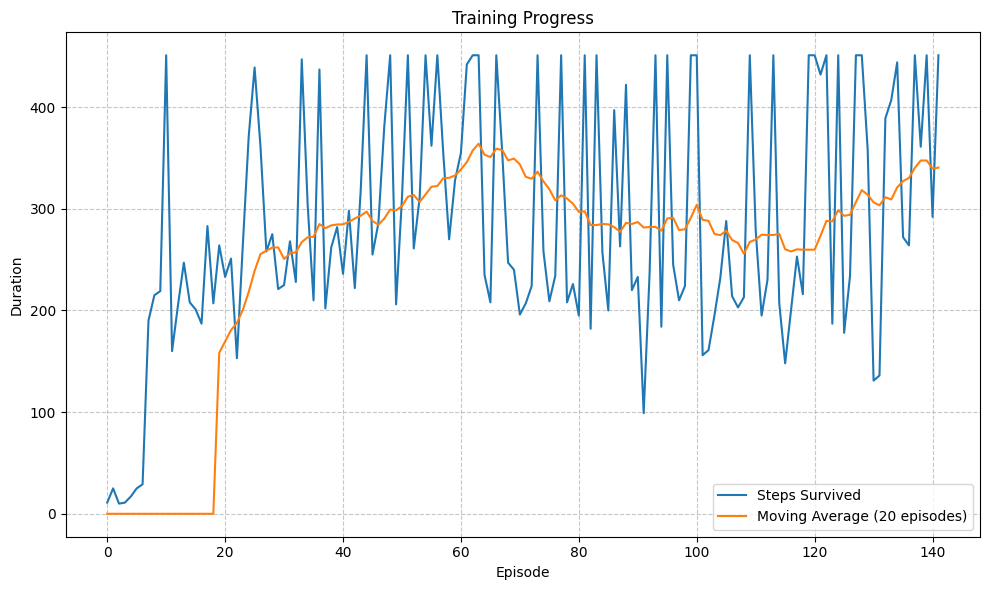

Hyperparameters: (0.995, 0.1, 0.001, 0.95)
Performance: 309.31
--------------------


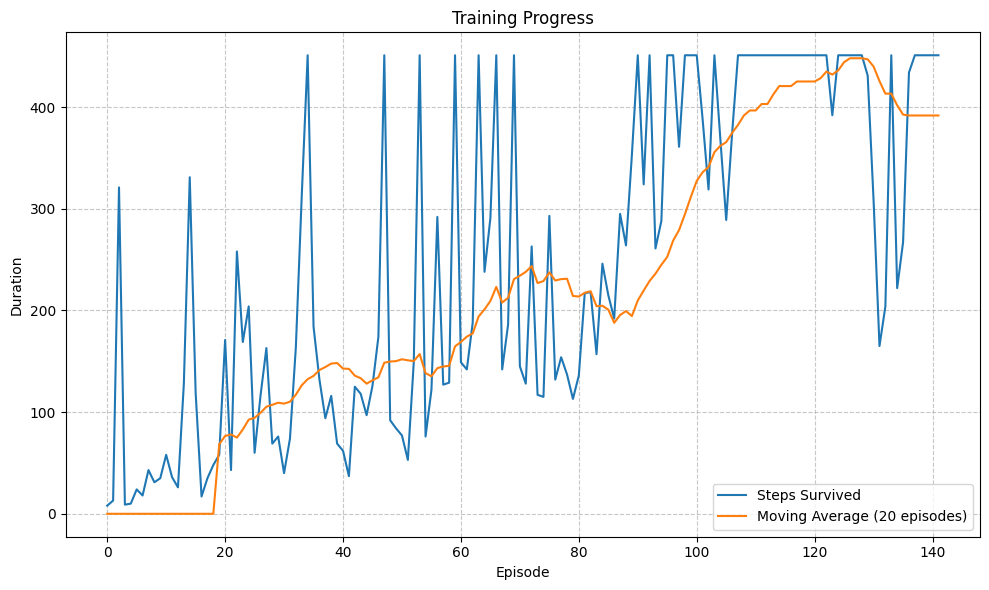

Hyperparameters: (0.995, 0.1, 0.001, 0.99)
Performance: 309.54
--------------------


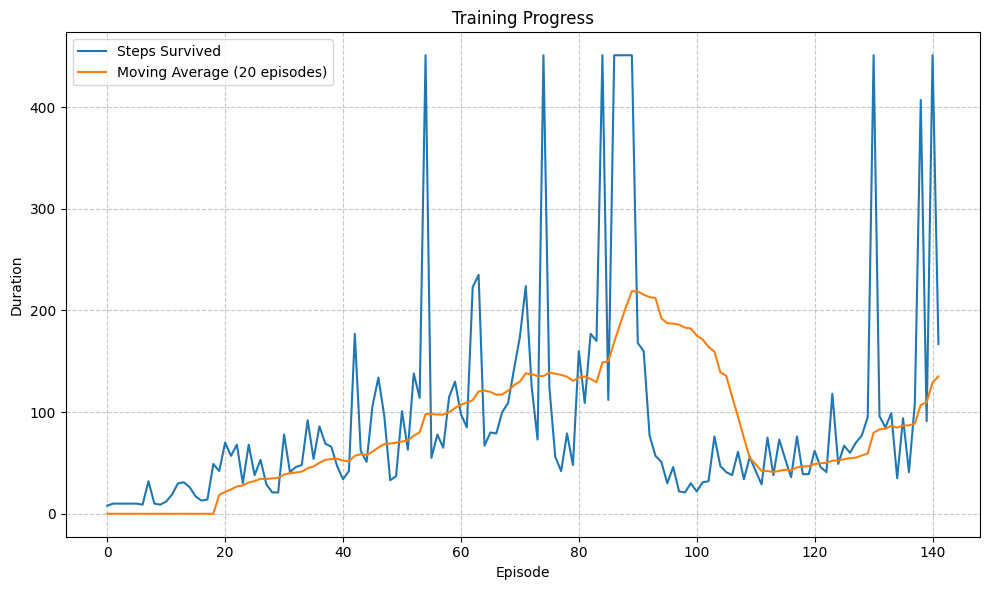

Hyperparameters: (0.995, 0.1, 0.001, 0.999)
Performance: 120.16
--------------------


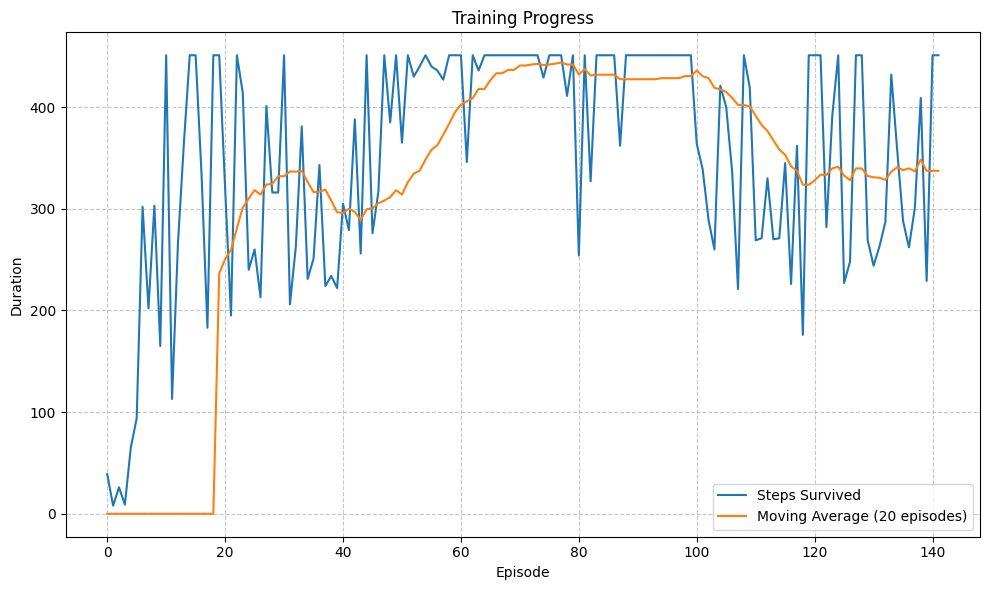

Hyperparameters: (0.995, 0.1, 0.005, 0.95)
Performance: 388.85
--------------------


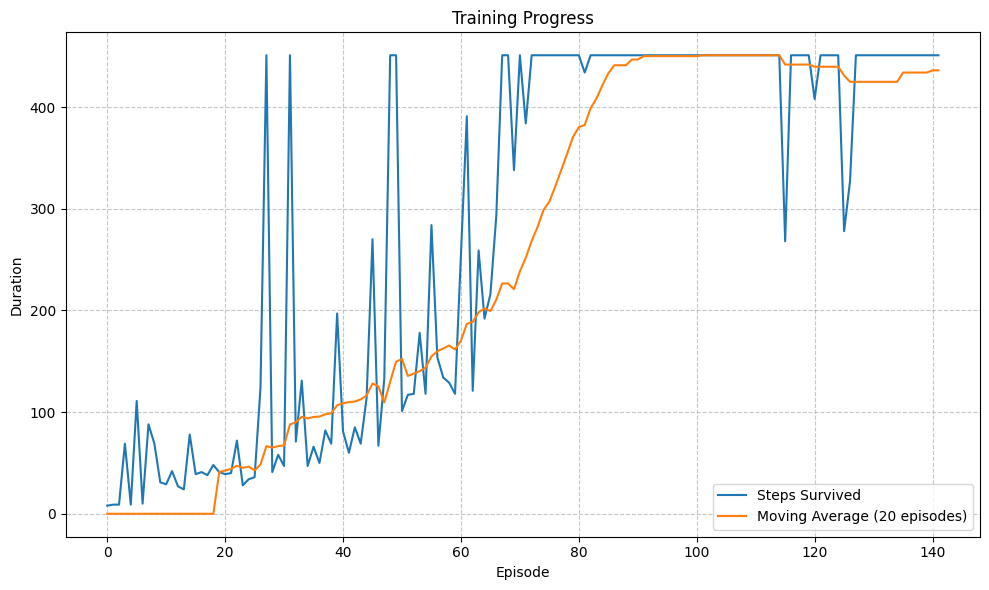

Hyperparameters: (0.995, 0.1, 0.005, 0.99)
Performance: 379.23
--------------------


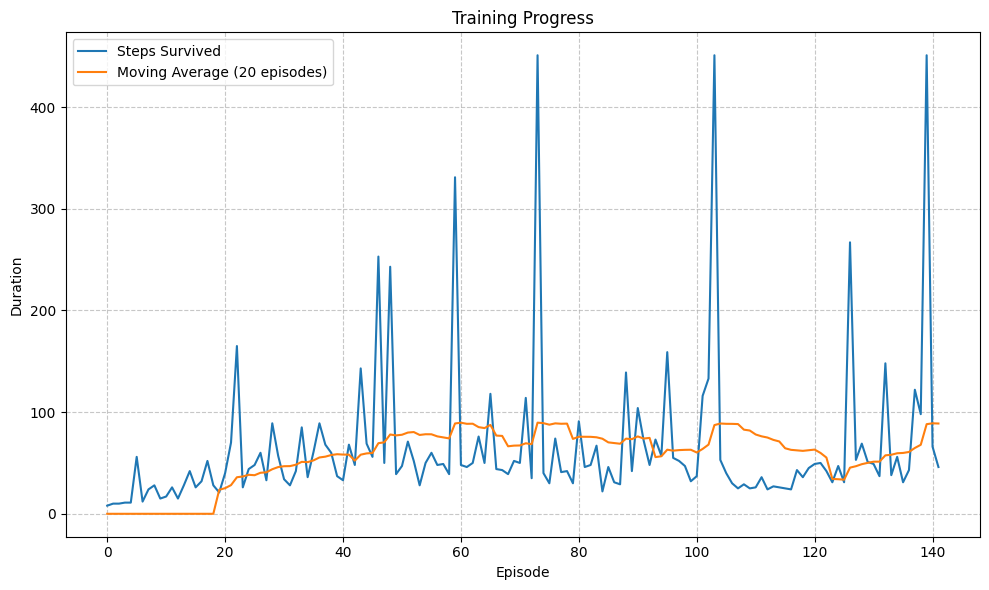

Hyperparameters: (0.995, 0.1, 0.005, 0.999)
Performance: 75.35
--------------------


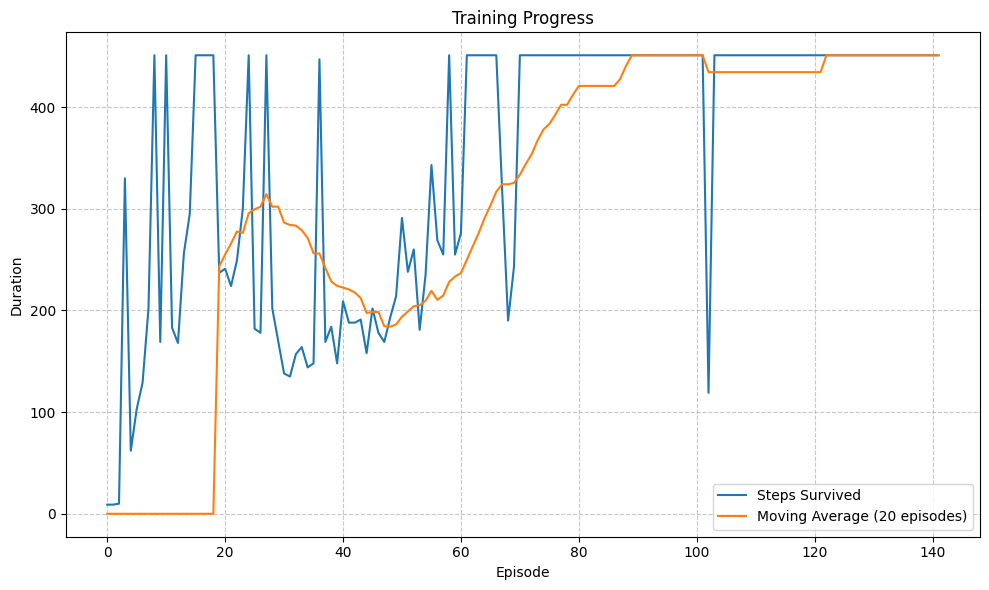

Hyperparameters: (0.995, 0.1, 0.01, 0.95)
Performance: 401.43
--------------------


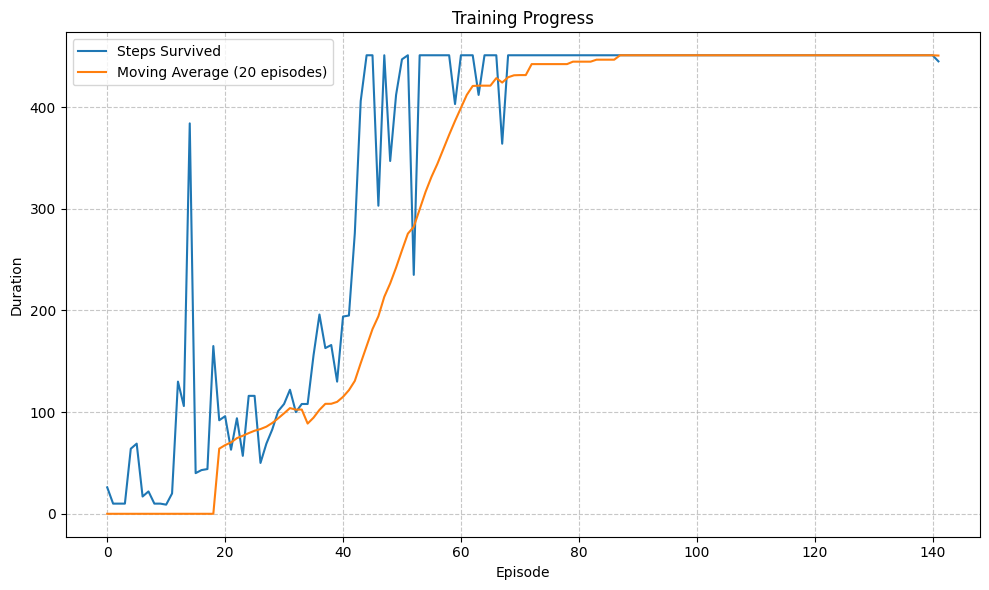

Hyperparameters: (0.995, 0.1, 0.01, 0.99)
Performance: 441.89
--------------------


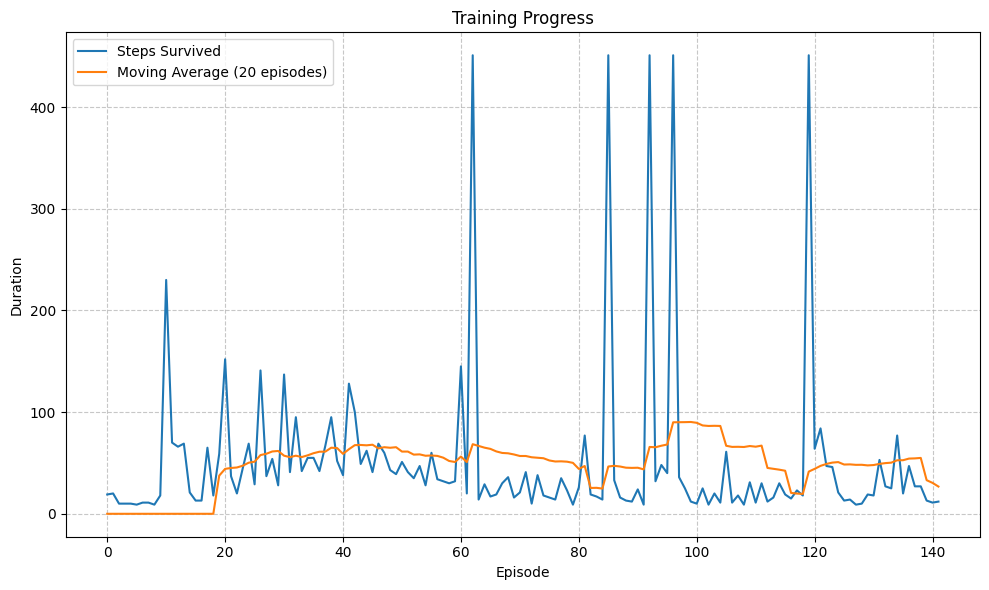

Hyperparameters: (0.995, 0.1, 0.01, 0.999)
Performance: 51.75
--------------------


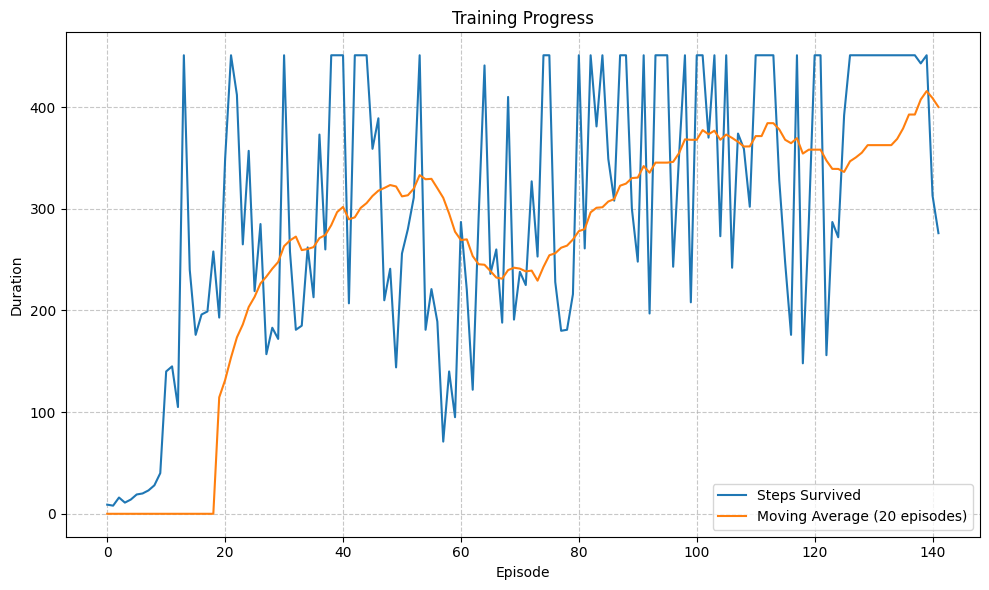

Hyperparameters: (0.995, 0.2, 0.001, 0.95)
Performance: 337.11
--------------------


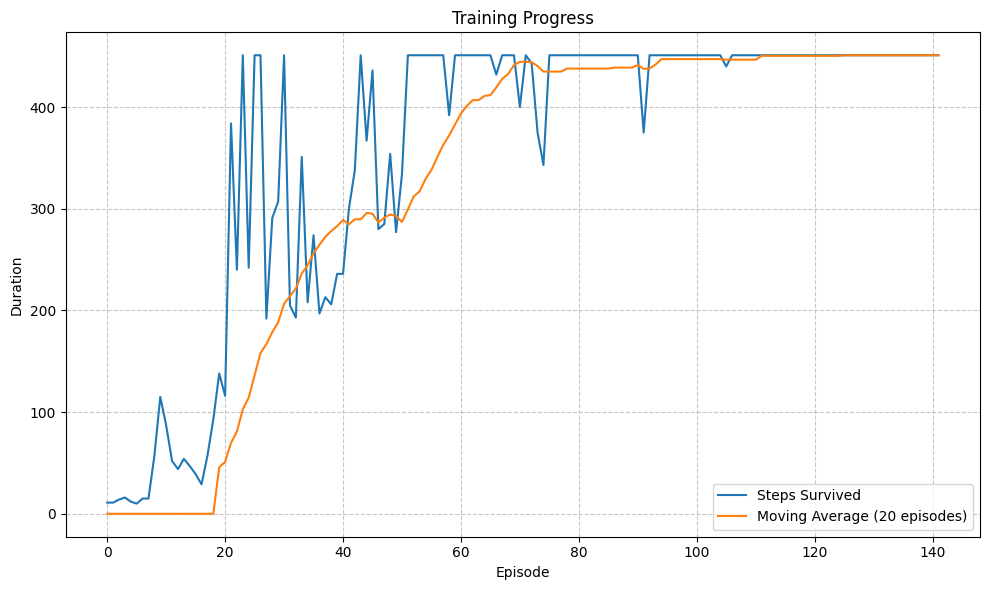

Hyperparameters: (0.995, 0.2, 0.001, 0.99)
Performance: 437.55
--------------------


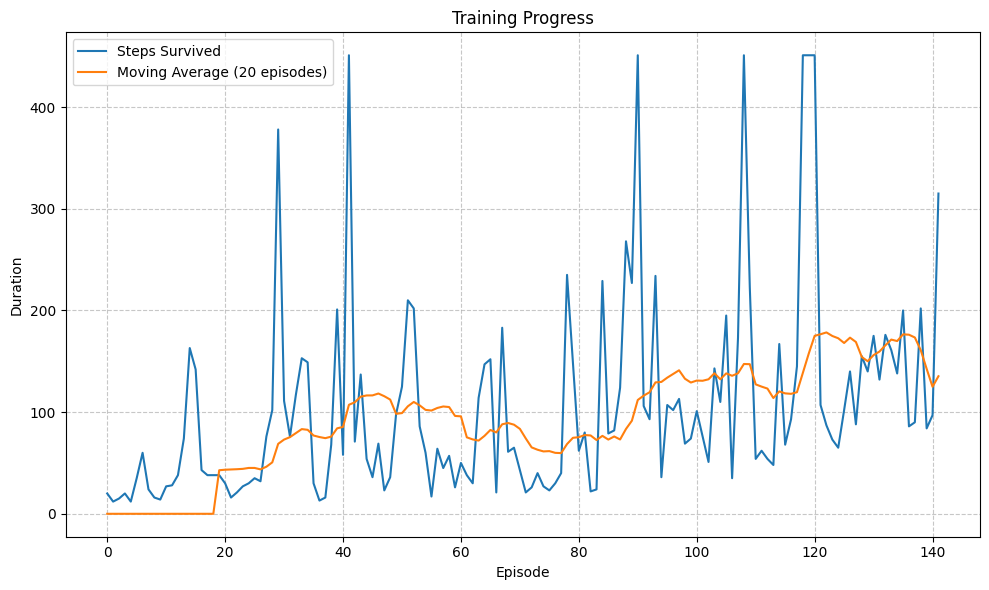

Hyperparameters: (0.995, 0.2, 0.001, 0.999)
Performance: 119.08
--------------------


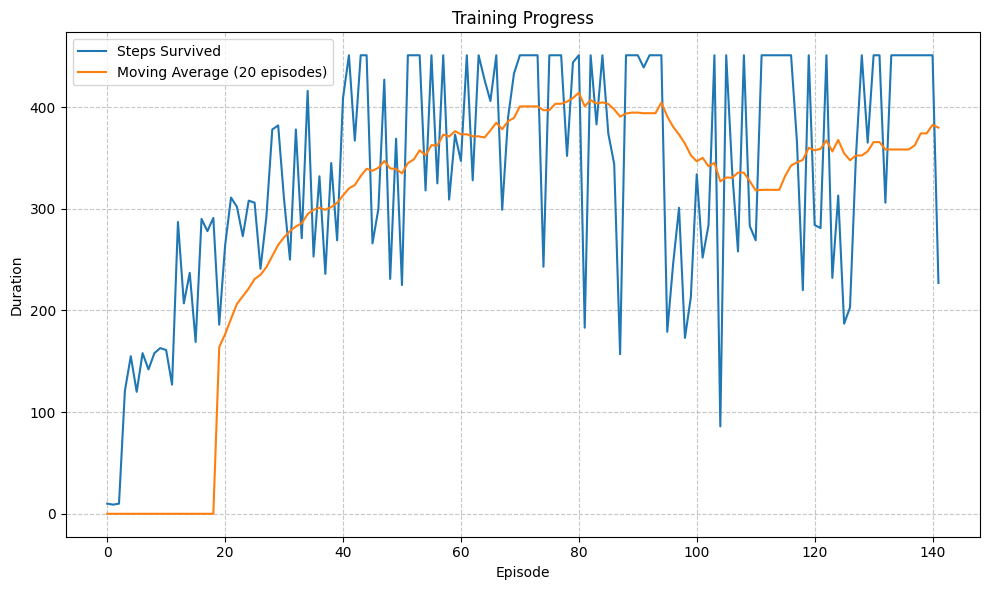

Hyperparameters: (0.995, 0.2, 0.005, 0.95)
Performance: 372.58
--------------------


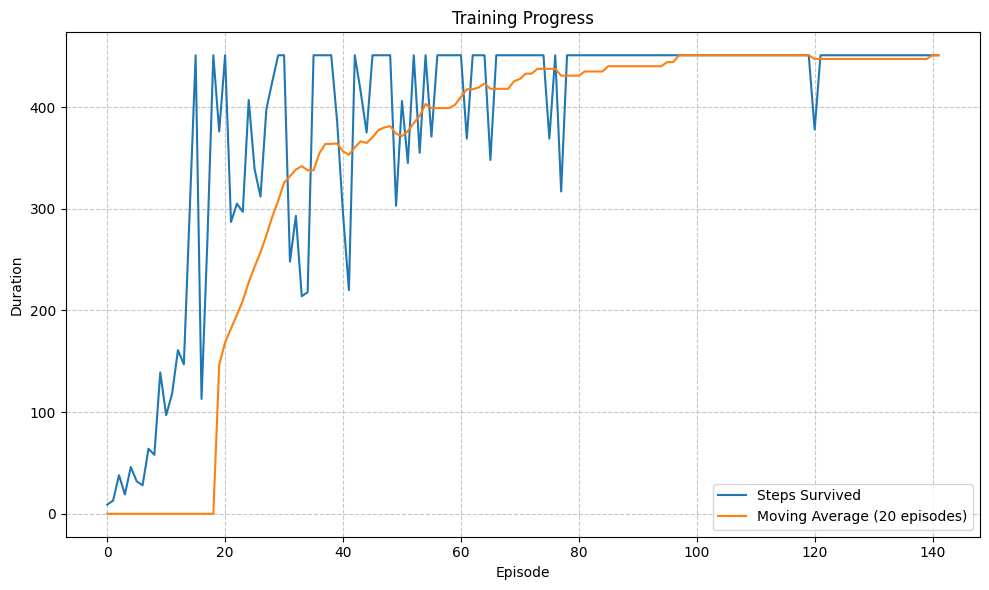

Hyperparameters: (0.995, 0.2, 0.005, 0.99)
Performance: 440.39
--------------------


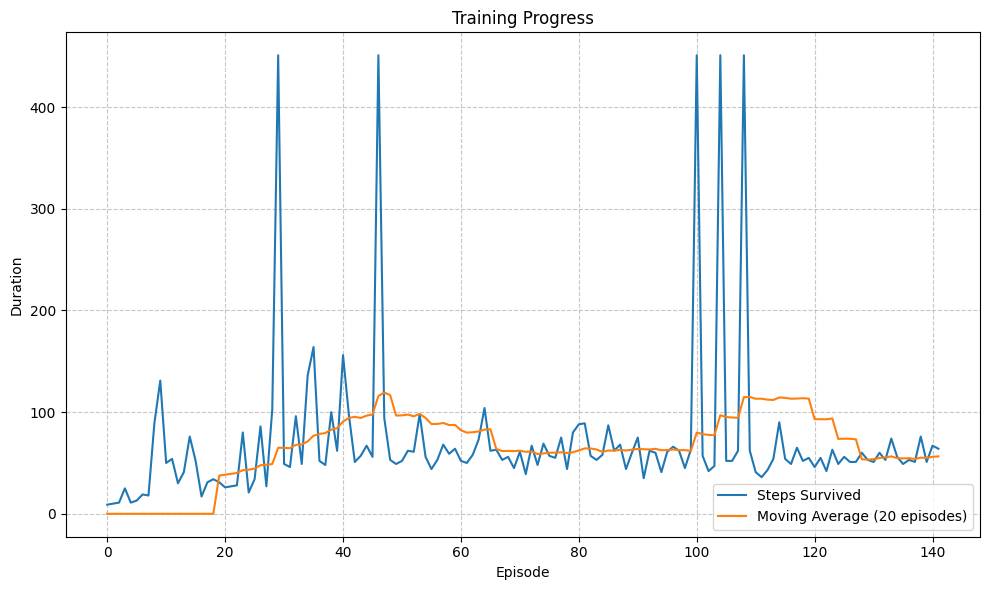

Hyperparameters: (0.995, 0.2, 0.005, 0.999)
Performance: 74.39
--------------------


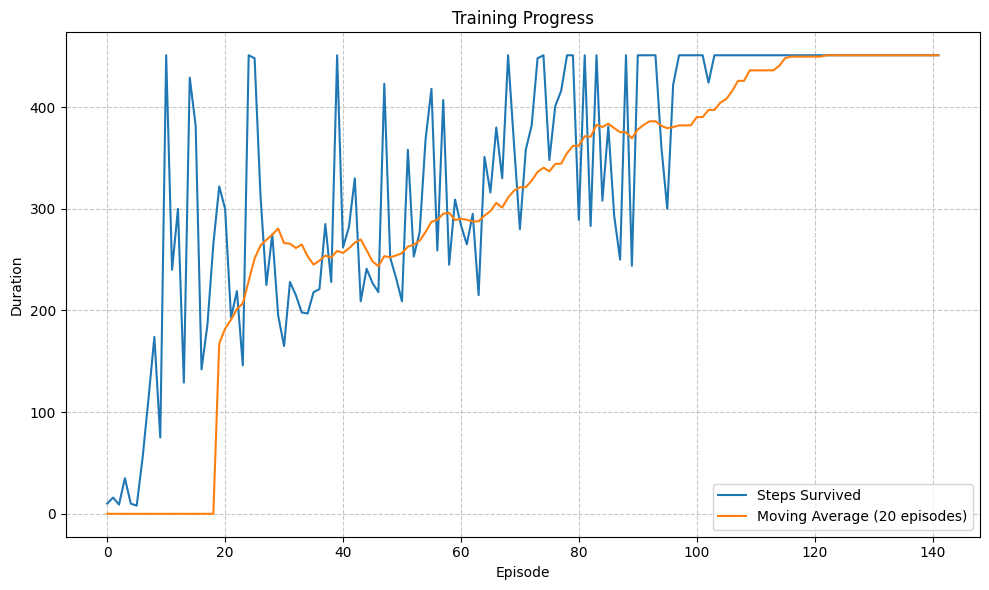

Hyperparameters: (0.995, 0.2, 0.01, 0.95)
Performance: 390.28
--------------------


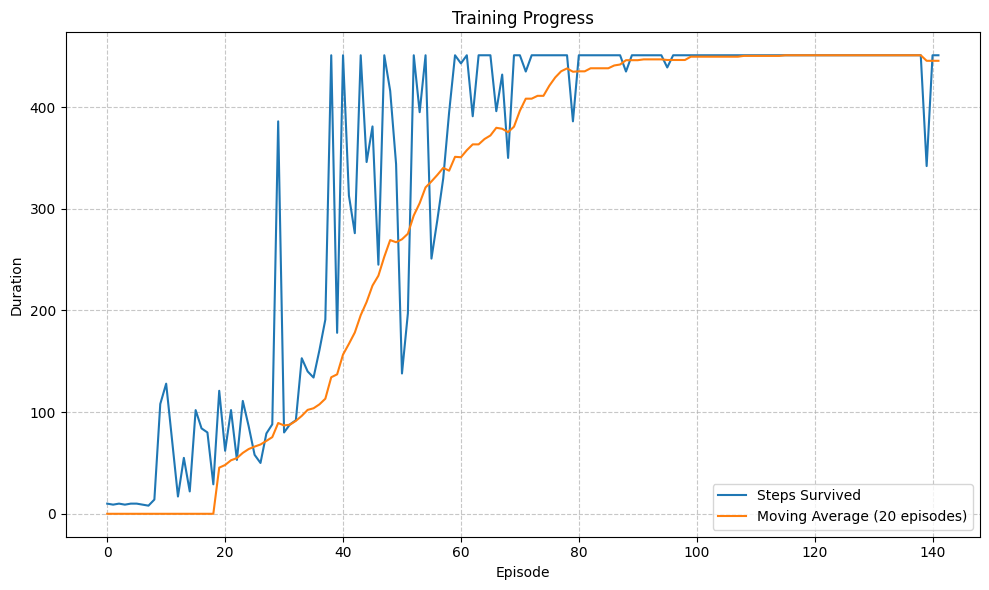

Hyperparameters: (0.995, 0.2, 0.01, 0.99)
Performance: 427.79
--------------------


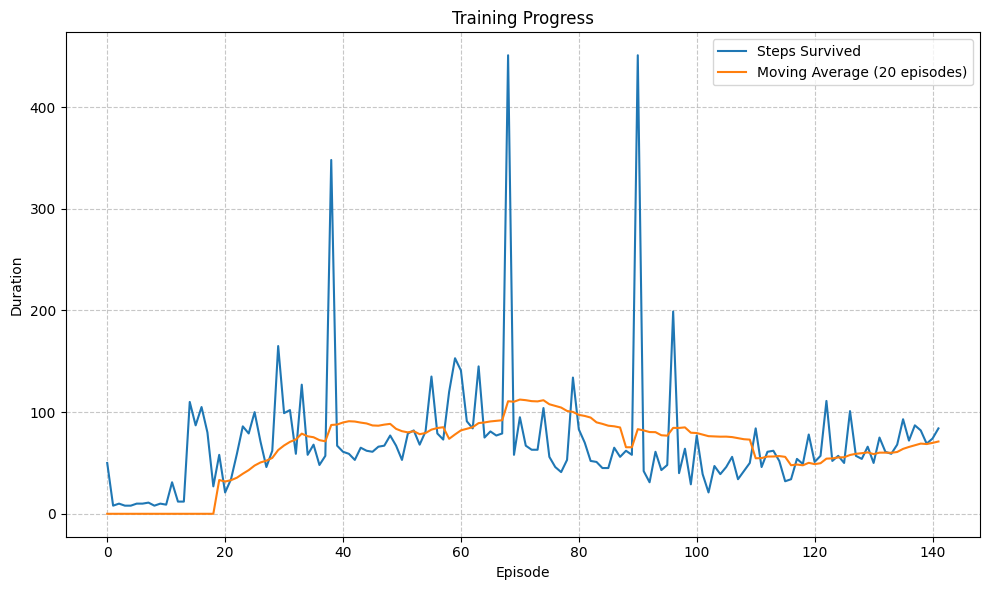

Hyperparameters: (0.995, 0.2, 0.01, 0.999)
Performance: 75.73
--------------------


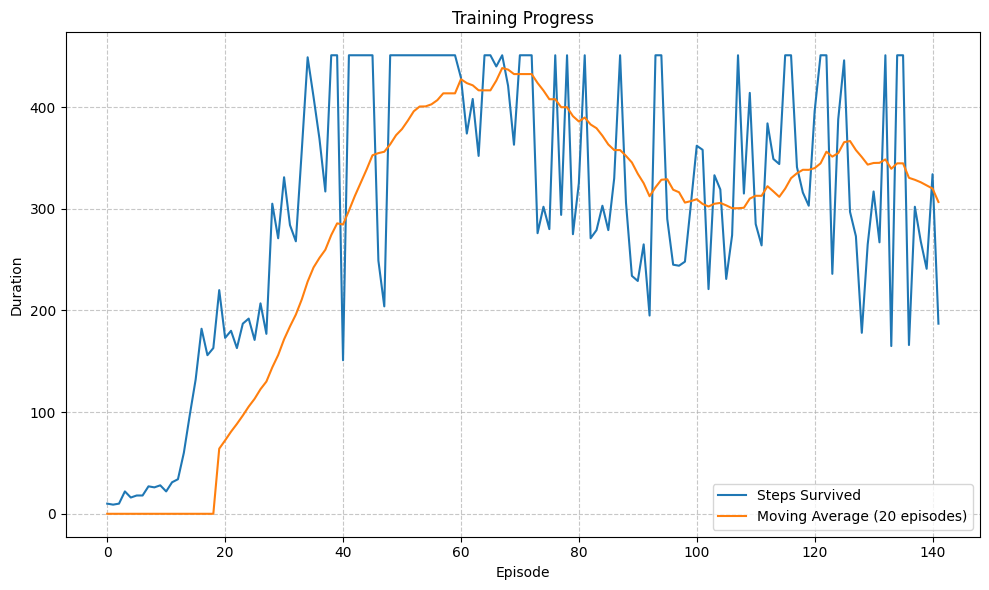

Hyperparameters: (0.998, 0.05, 0.001, 0.95)
Performance: 353.89
--------------------


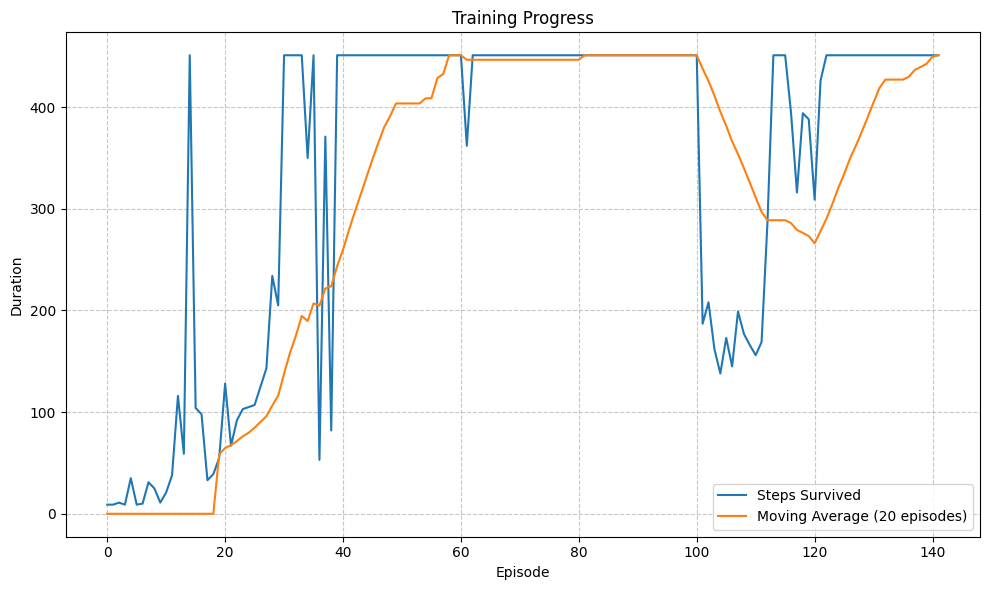

Hyperparameters: (0.998, 0.05, 0.001, 0.99)
Performance: 412.87
--------------------


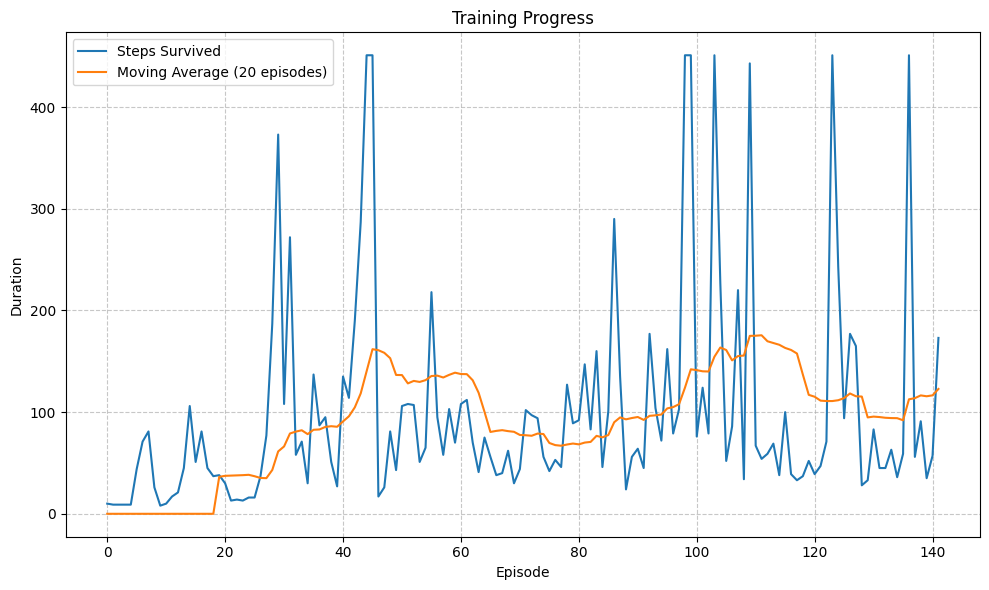

Hyperparameters: (0.998, 0.05, 0.001, 0.999)
Performance: 116.33
--------------------


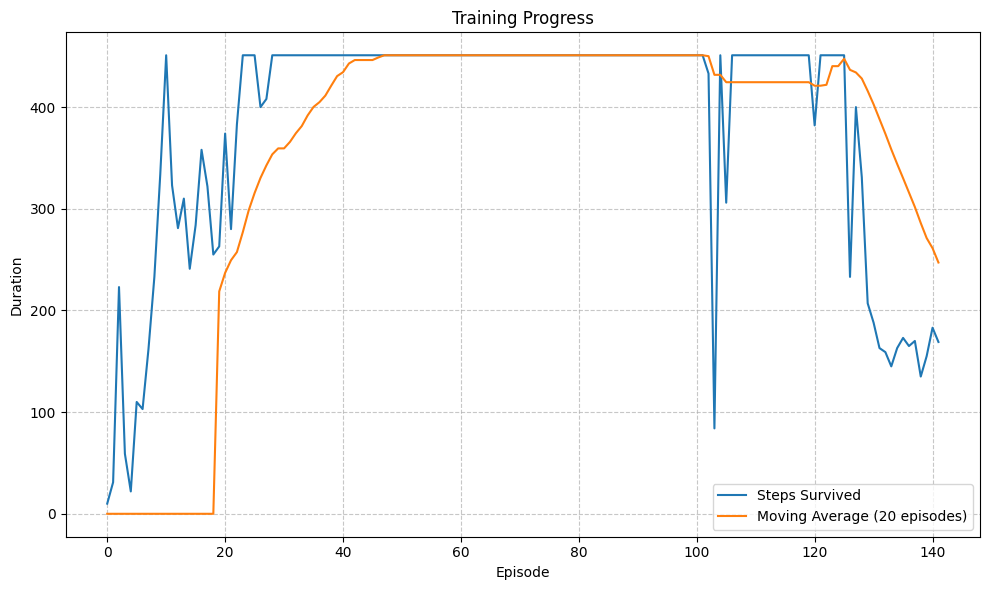

Hyperparameters: (0.998, 0.05, 0.005, 0.95)
Performance: 404.24
--------------------


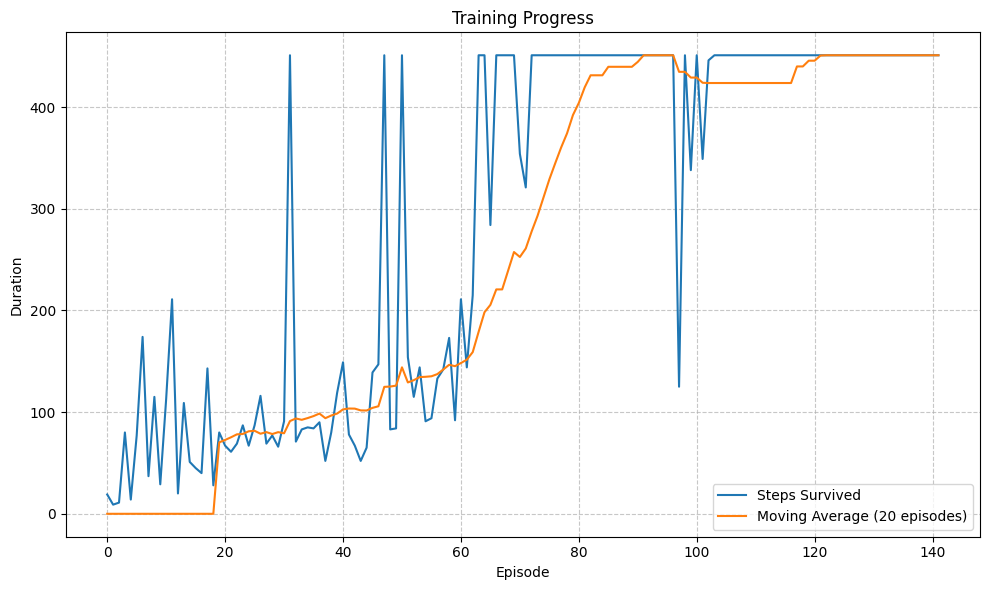

Hyperparameters: (0.998, 0.05, 0.005, 0.99)
Performance: 379.36
--------------------


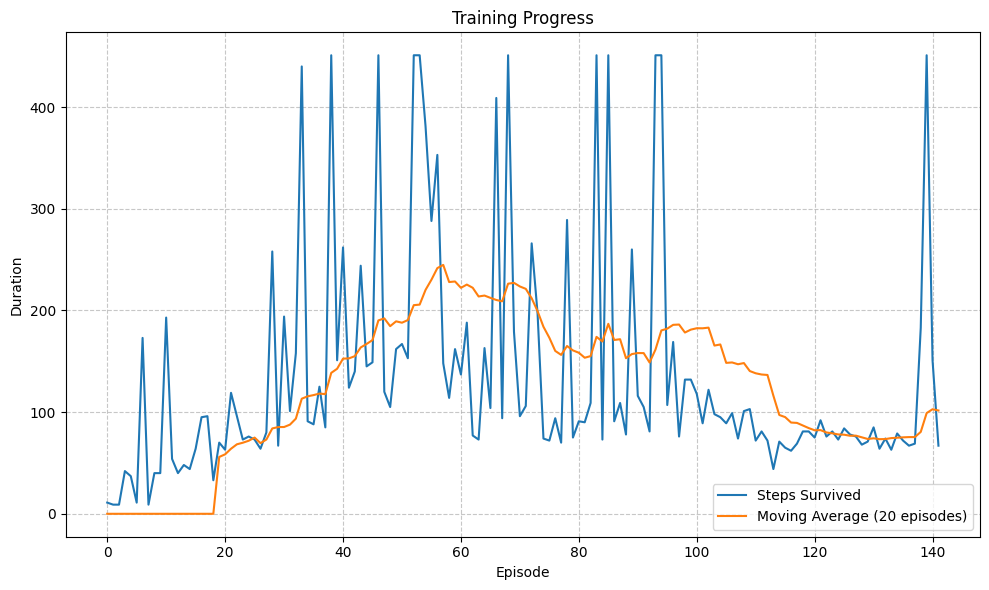

Hyperparameters: (0.998, 0.05, 0.005, 0.999)
Performance: 149.06
--------------------


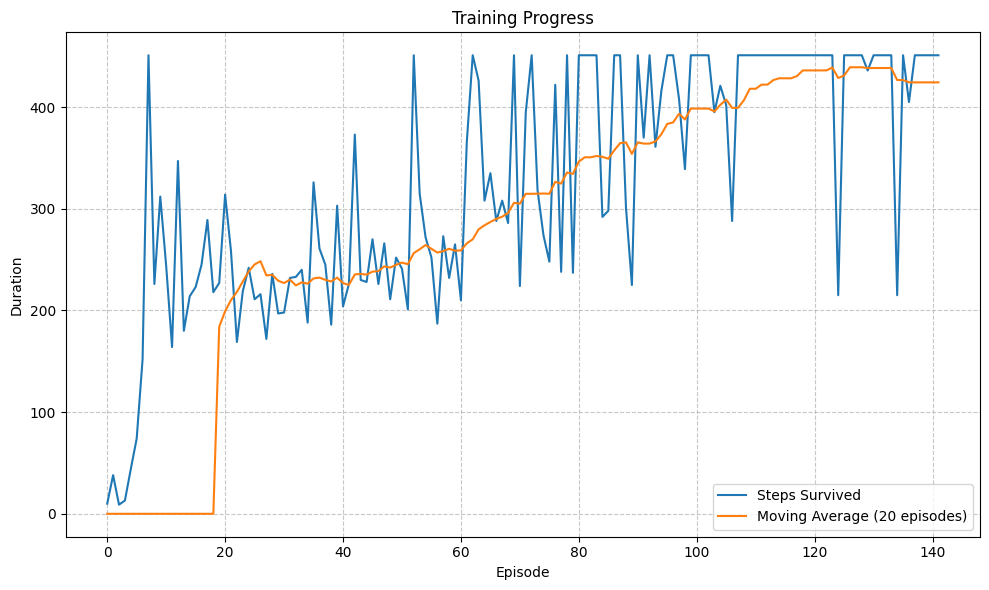

Hyperparameters: (0.998, 0.05, 0.01, 0.95)
Performance: 375.14
--------------------


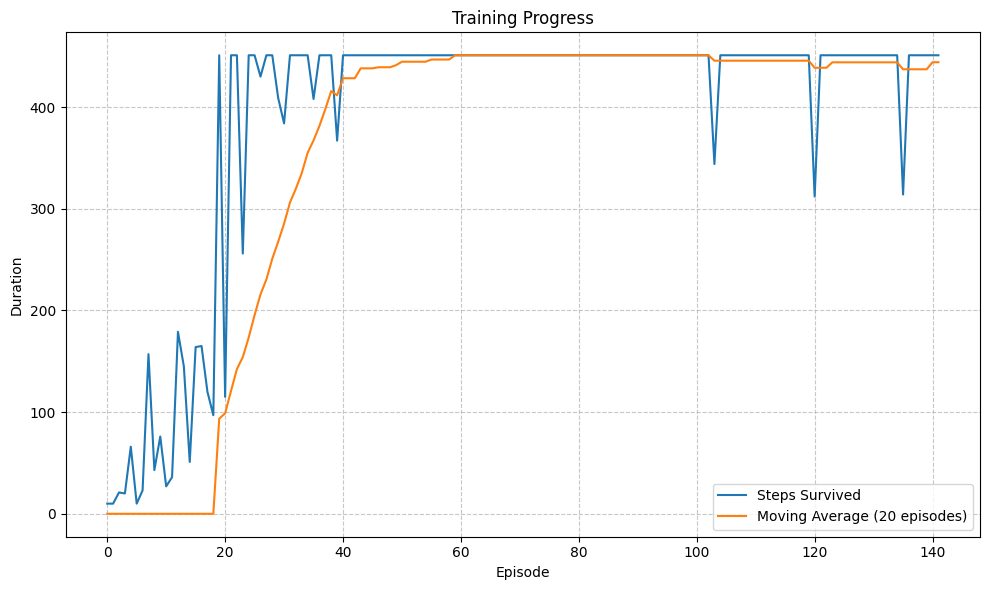

Hyperparameters: (0.998, 0.05, 0.01, 0.99)
Performance: 447.17
--------------------


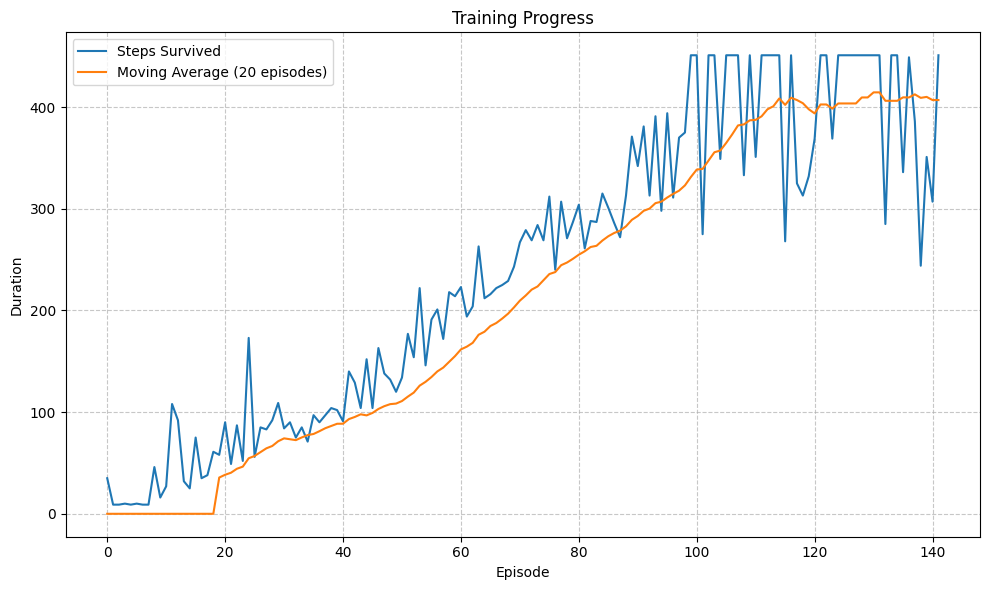

Hyperparameters: (0.998, 0.05, 0.01, 0.999)
Performance: 314.28
--------------------


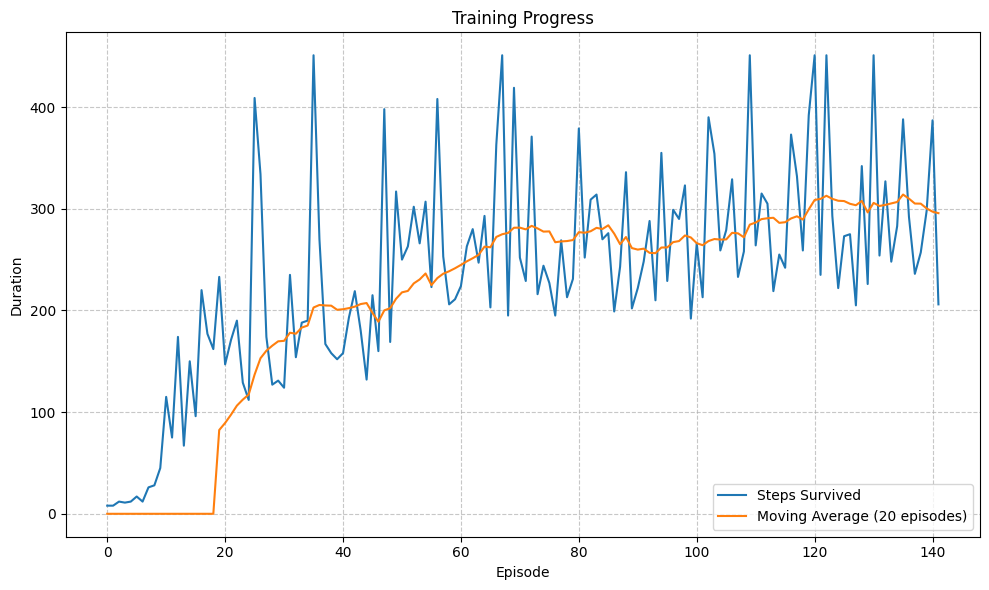

Hyperparameters: (0.998, 0.1, 0.001, 0.95)
Performance: 278.88
--------------------


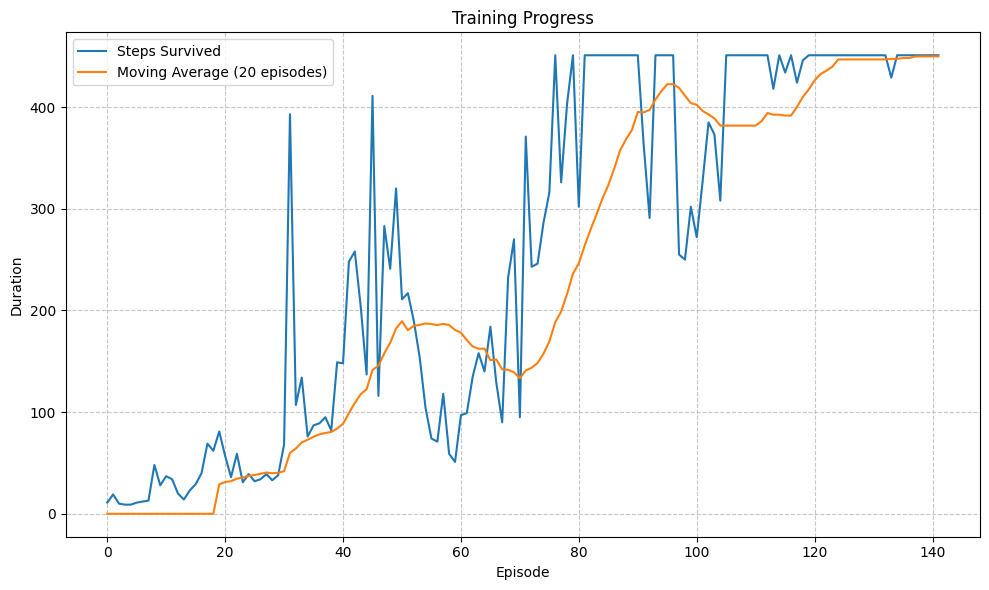

Hyperparameters: (0.998, 0.1, 0.001, 0.99)
Performance: 342.66
--------------------


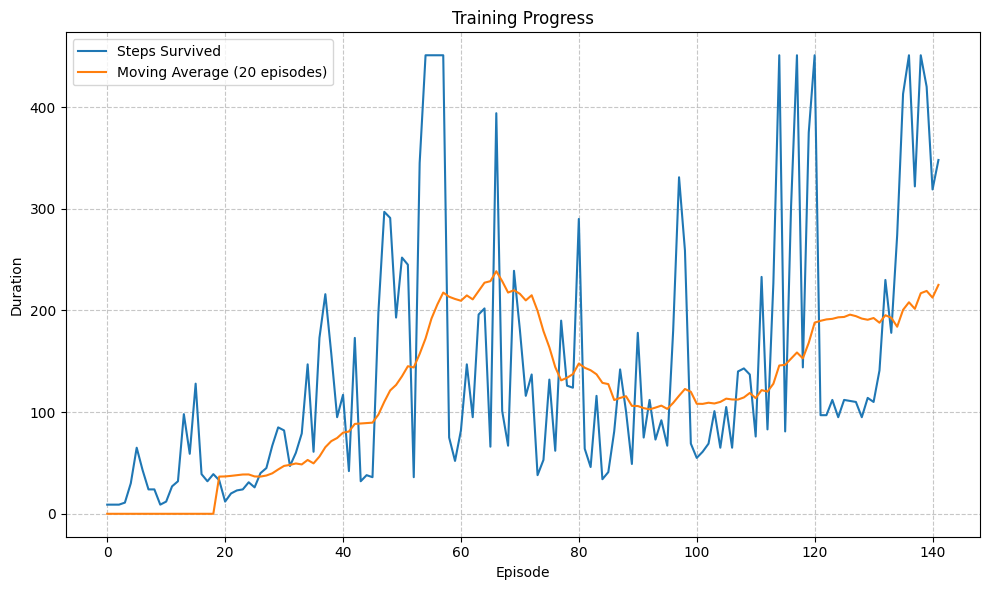

Hyperparameters: (0.998, 0.1, 0.001, 0.999)
Performance: 176.3
--------------------


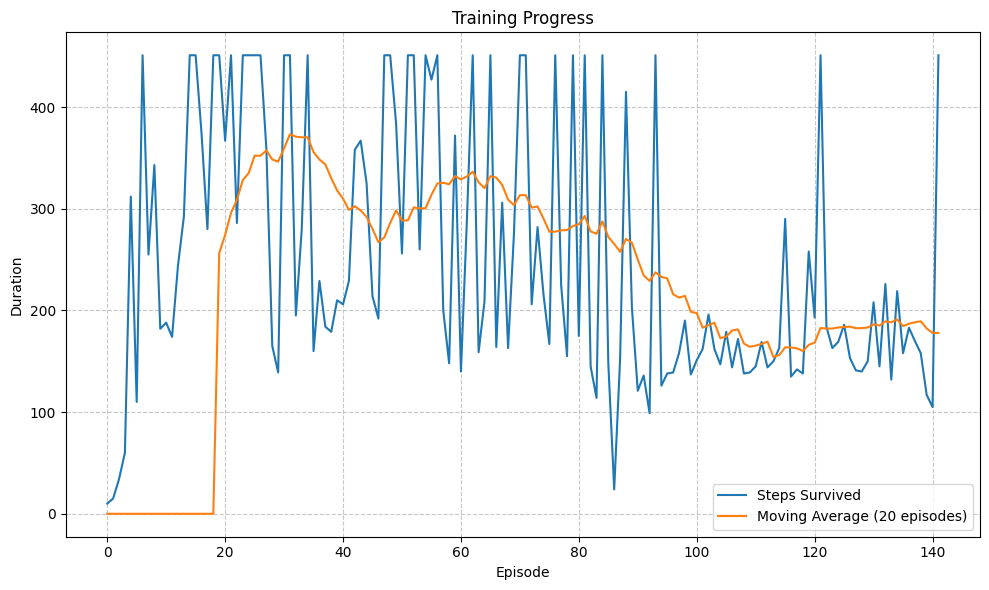

Hyperparameters: (0.998, 0.1, 0.005, 0.95)
Performance: 233.69
--------------------


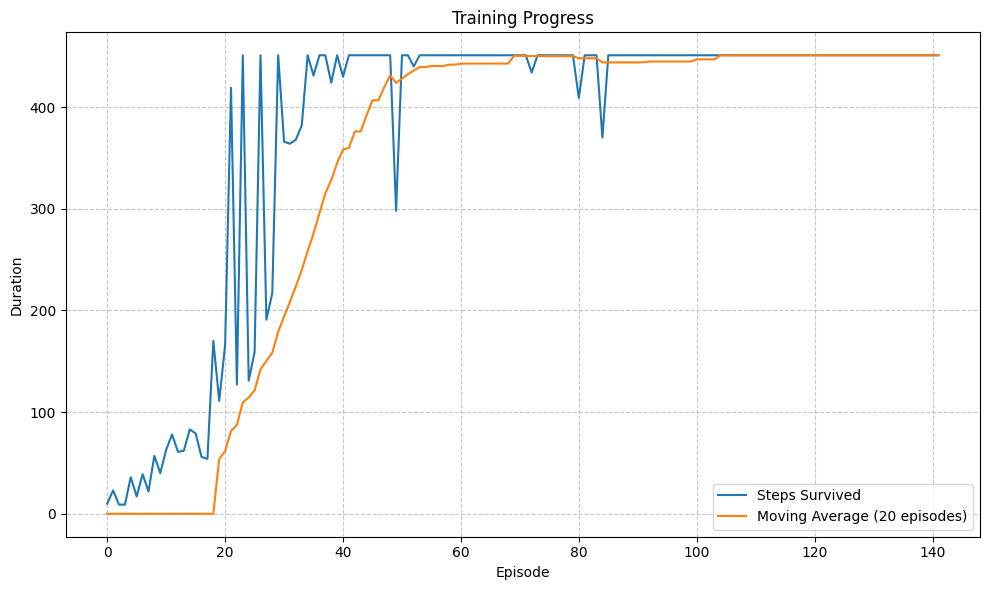

Hyperparameters: (0.998, 0.1, 0.005, 0.99)
Performance: 447.96
--------------------


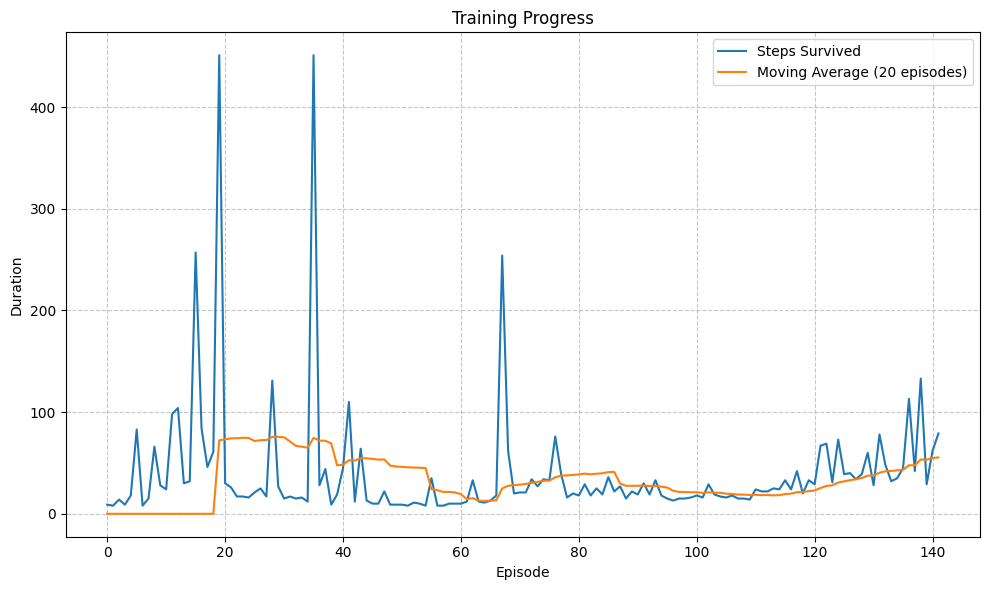

Hyperparameters: (0.998, 0.1, 0.005, 0.999)
Performance: 31.07
--------------------


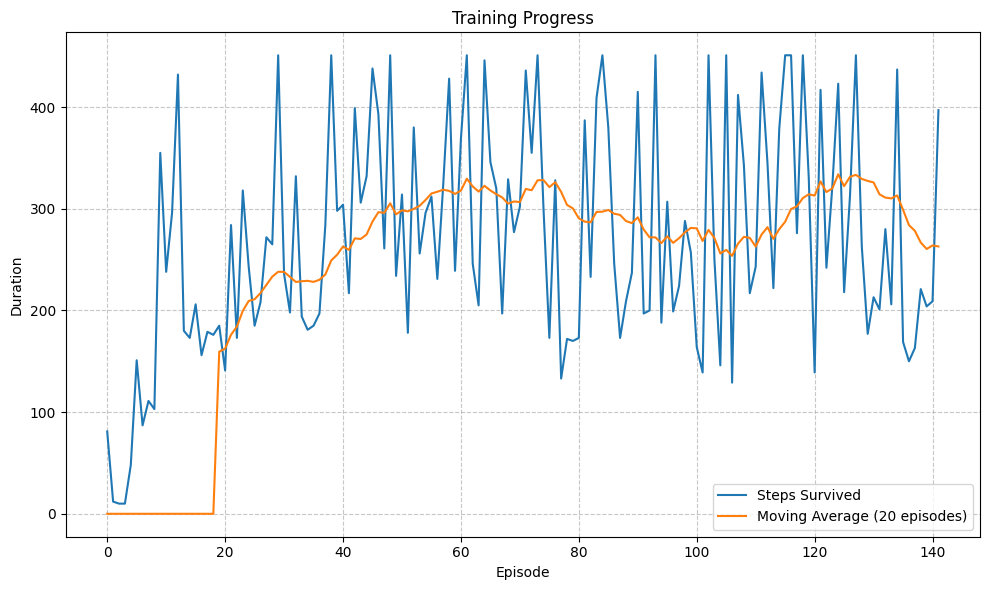

Hyperparameters: (0.998, 0.1, 0.01, 0.95)
Performance: 295.03
--------------------


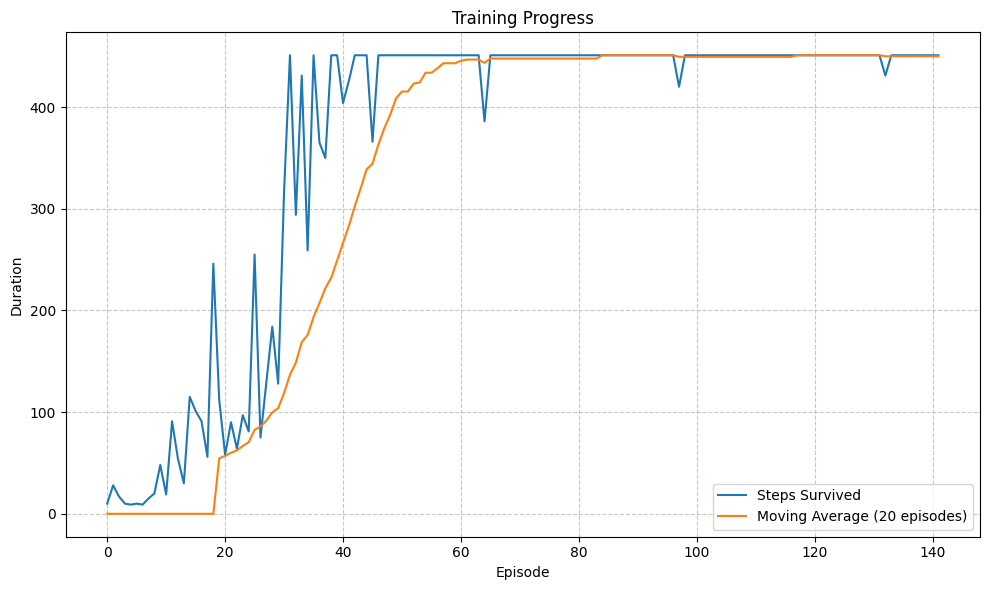

Hyperparameters: (0.998, 0.1, 0.01, 0.99)
Performance: 448.99
--------------------


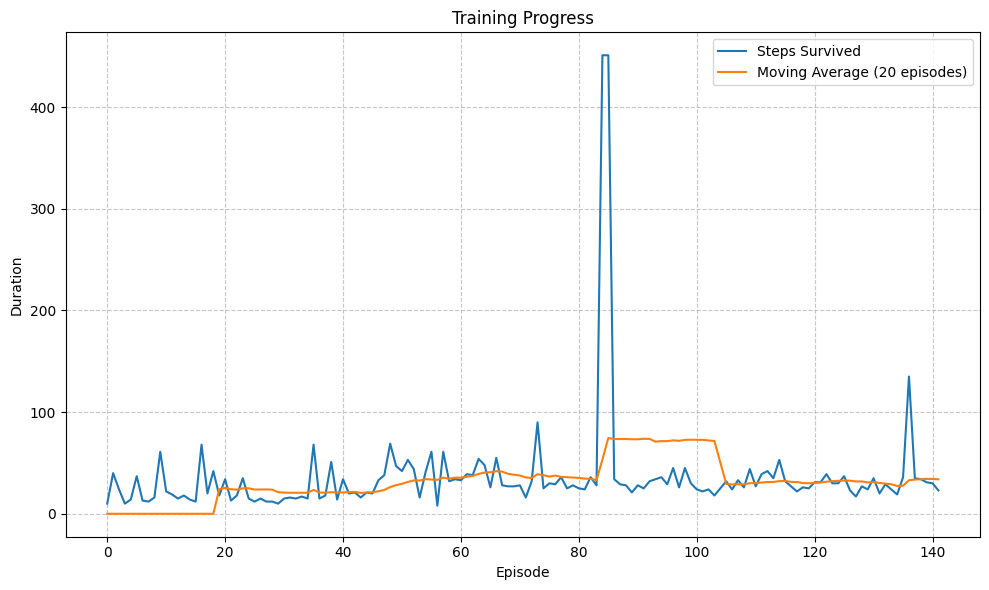

Hyperparameters: (0.998, 0.1, 0.01, 0.999)
Performance: 41.68
--------------------


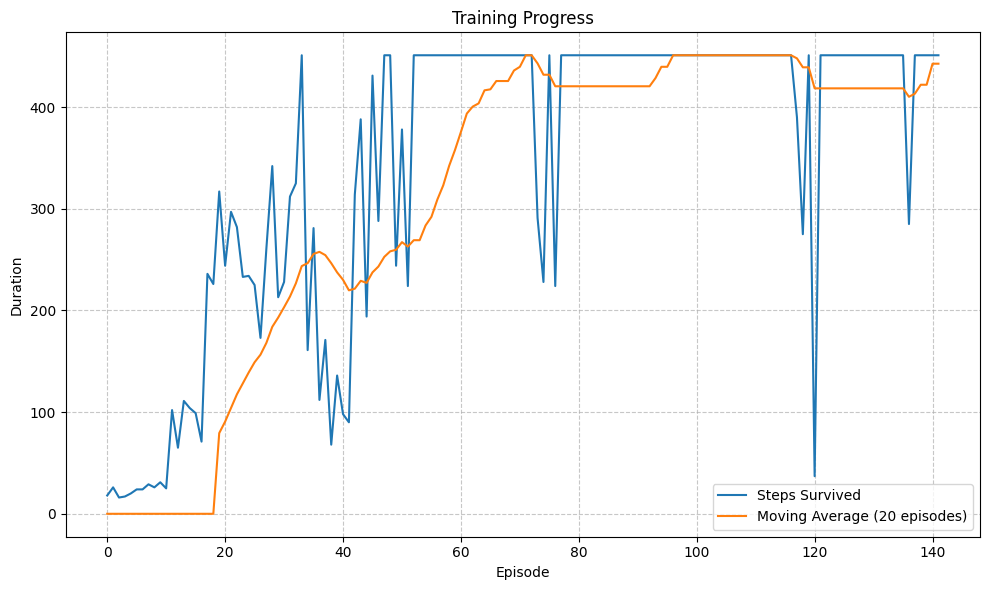

Hyperparameters: (0.998, 0.2, 0.001, 0.95)
Performance: 425.26
--------------------


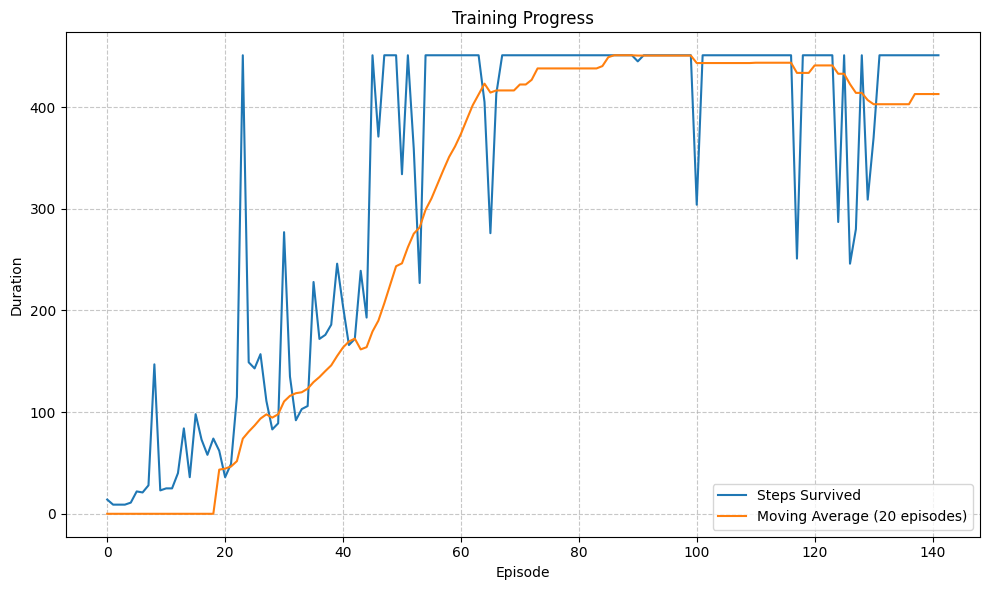

Hyperparameters: (0.998, 0.2, 0.001, 0.99)
Performance: 424.63
--------------------


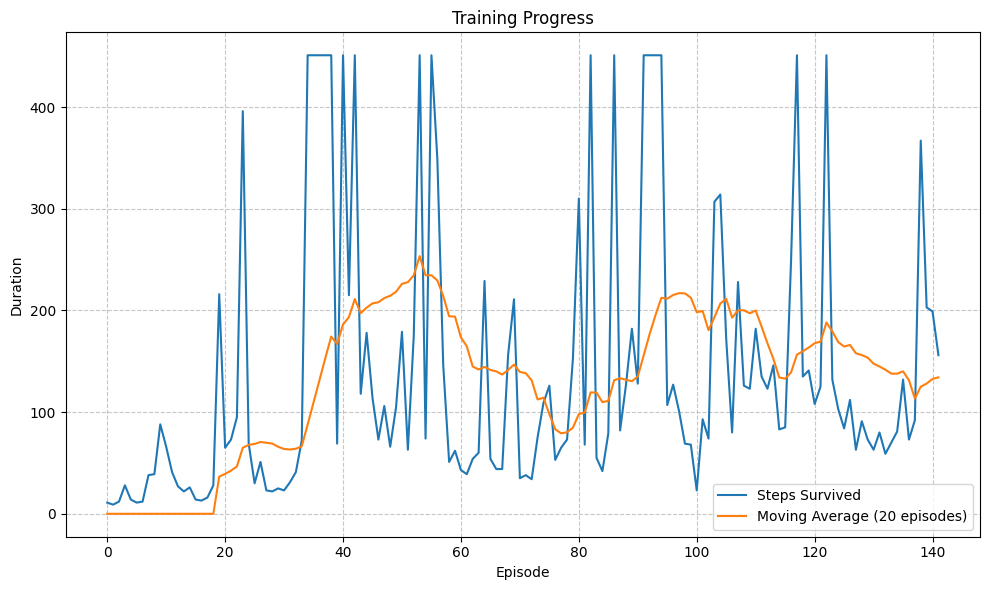

Hyperparameters: (0.998, 0.2, 0.001, 0.999)
Performance: 153.45
--------------------


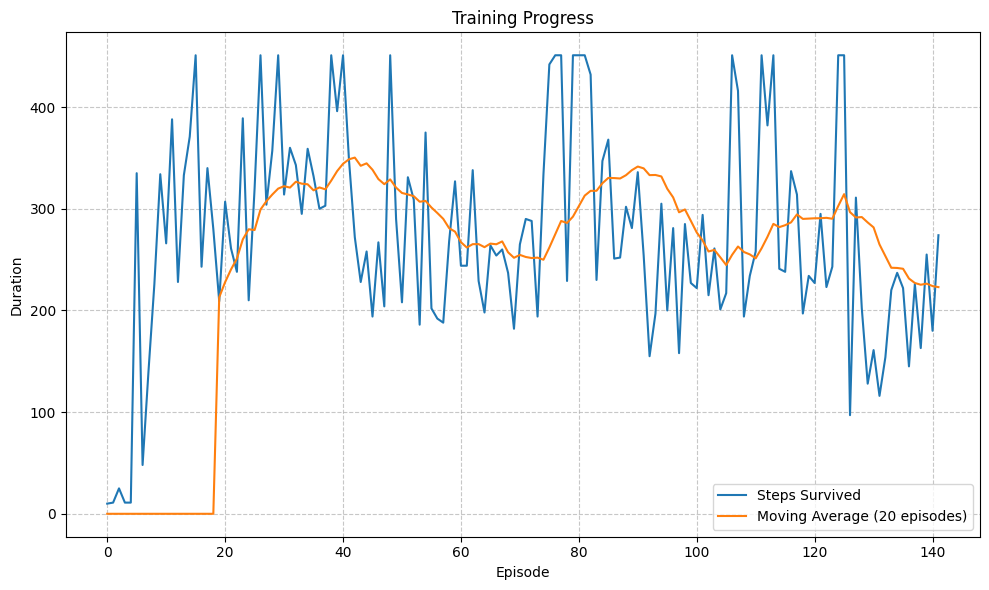

Hyperparameters: (0.998, 0.2, 0.005, 0.95)
Performance: 271.47
--------------------


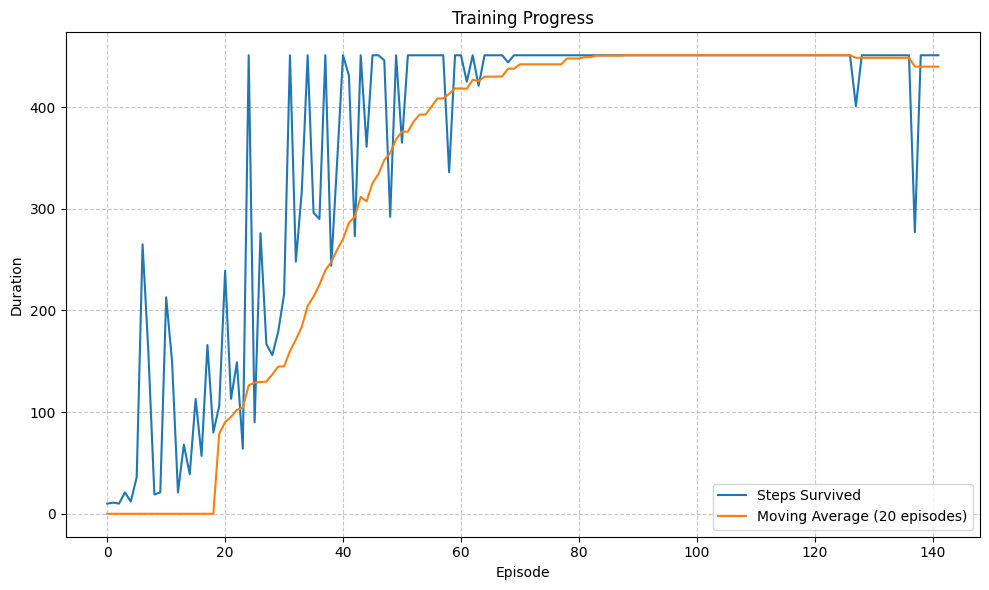

Hyperparameters: (0.998, 0.2, 0.005, 0.99)
Performance: 441.8
--------------------


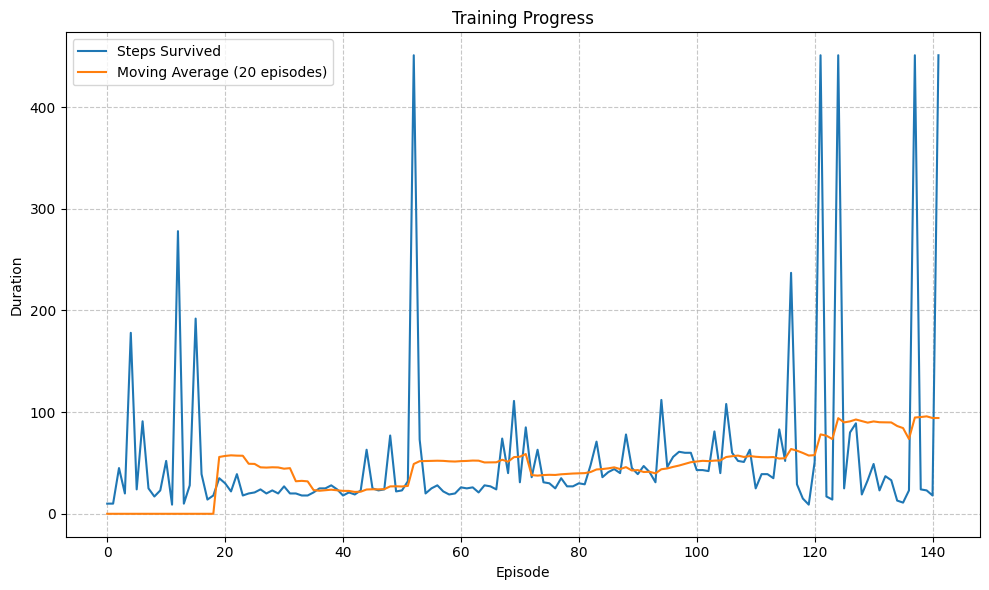

Hyperparameters: (0.998, 0.2, 0.005, 0.999)
Performance: 63.28
--------------------


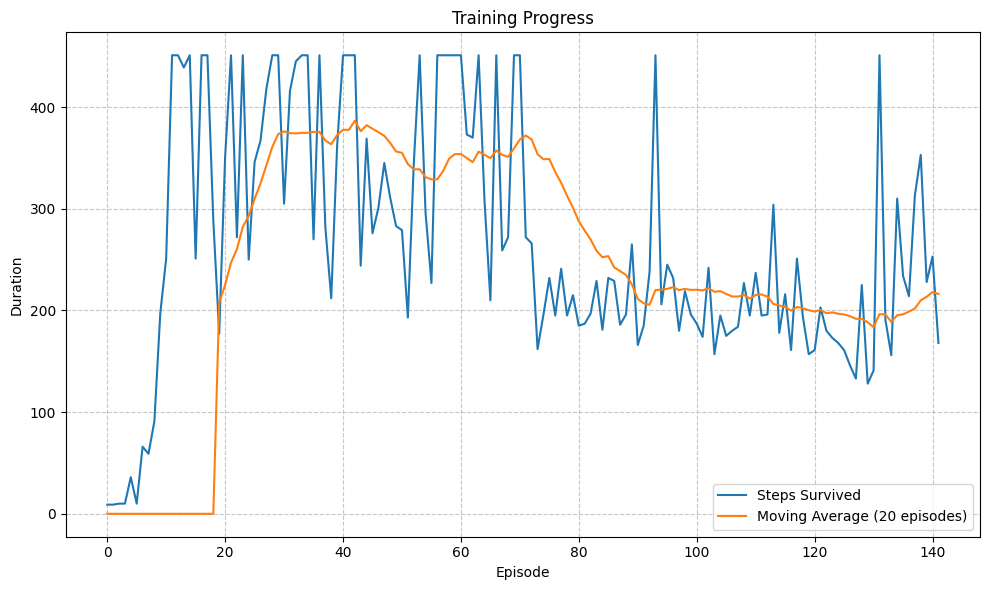

Hyperparameters: (0.998, 0.2, 0.01, 0.95)
Performance: 252.95
--------------------


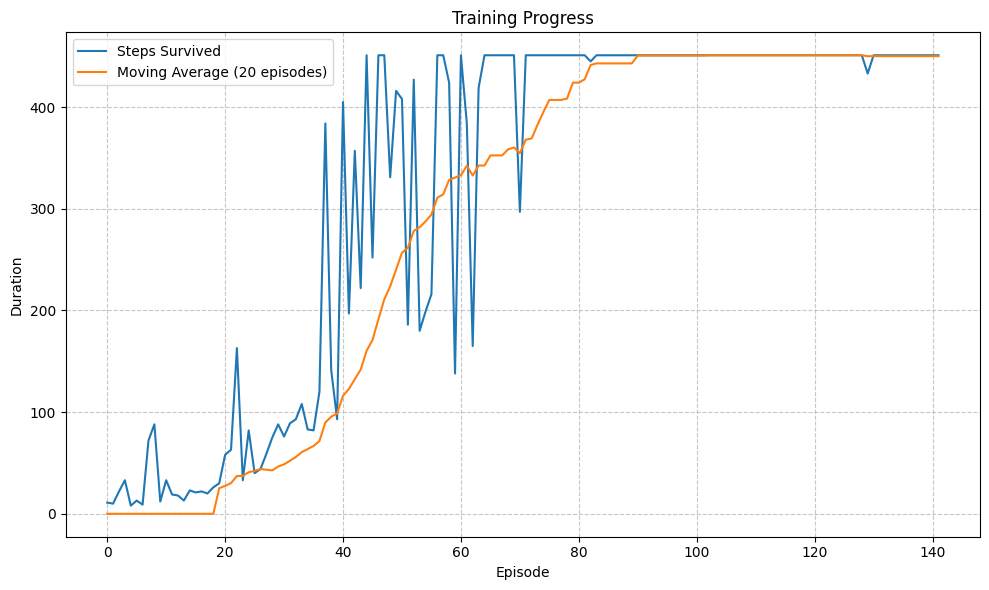

Hyperparameters: (0.998, 0.2, 0.01, 0.99)
Performance: 424.3
--------------------


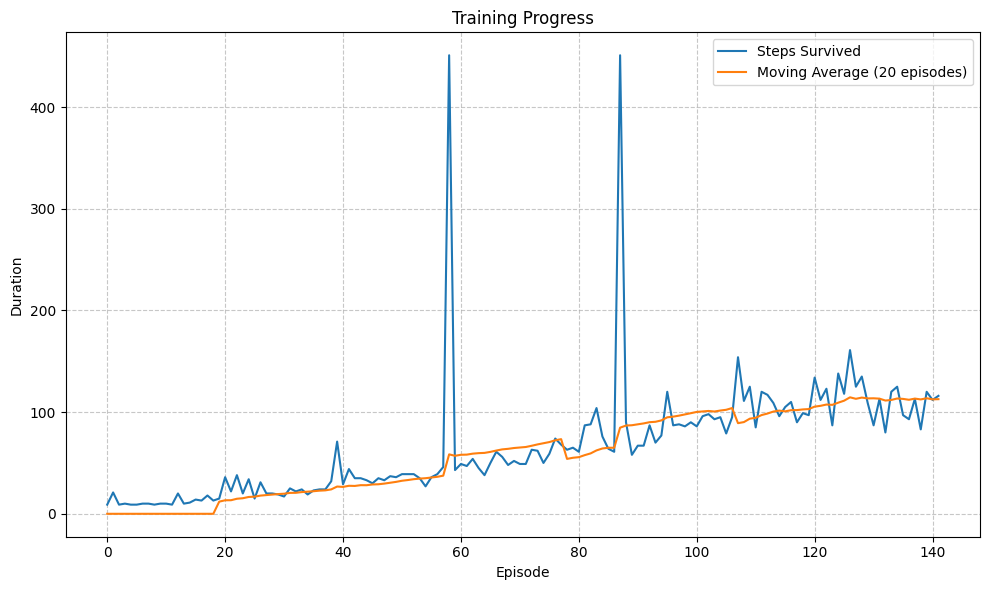

Hyperparameters: (0.998, 0.2, 0.01, 0.999)
Performance: 87.1
--------------------
Best Hyperparameters: (0.99, 0.2, 0.005, 0.99)
Best Performance: 449.63


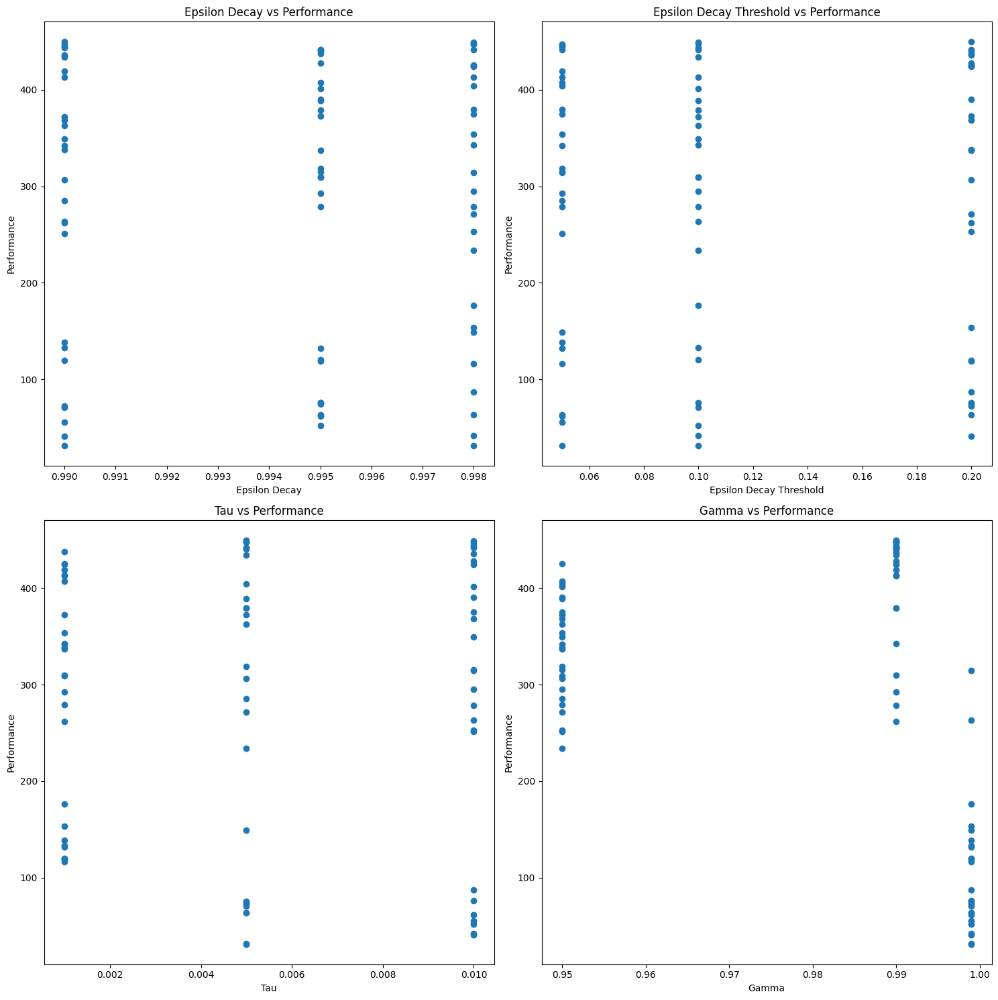

In [190]:
hyperparameter_tuning()

The best parameter setting and its performance is: 

`epsilon_decay` = 0.99, `epsilon_decay_threshold` = 0.2, `tau` = 0.005, `gamma` = 0.99, performance (average step survived) = 449.63

| Epsilon Decay | Epsilon Decay Threshold | Tau   | Gamma | Performance |
|---------------|-------------------------|-------|-------|-------------|
| 0.99          | 0.2                     | 0.005 | 0.99  | 449.63      |
| 0.99          | 0.1                     | 0.01  | 0.99  | 443.49      |
| 0.99          | 0.05                    | 0.01  | 0.99  | 444.87      |
| 0.99          | 0.05                    | 0.005 | 0.99  | 447.23      |
| 0.995         | 0.2                     | 0.005 | 0.99  | 440.39      |
| 0.995         | 0.1                     | 0.01  | 0.99  | 441.89      |
| 0.995         | 0.05                    | 0.005 | 0.99  | 441.29      |
| 0.998         | 0.2                     | 0.005 | 0.99  | 441.80      |
| 0.998         | 0.1                     | 0.01  | 0.99  | 448.99      |
| 0.998         | 0.1                     | 0.005 | 0.99  | 447.96      |
| 0.998         | 0.05                    | 0.01  | 0.99  | 447.17      |


Here I also make a summary about all the hyperparameter settings with performance greater than 440. We can see that `gamma` shouldn't be either too small (0.95) or too big (0.999), and `tau` should be reasonable big enough to update the target network in time. While epsilon decay and its threshold seems not essential in the parameter tuning.